# Set up

In [1]:
import xarray as xr
import numpy as np

data_dir = "data"
ds_hist = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_historical_r1i1p1f1_1850_2014_allvars.nc")
ds_ssp126 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp126_r1i1p1f1_2015_2100_allvars.nc")
ds_ssp245 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp245_r1i1p1f1_2015_2100_allvars.nc")
ds_ssp585 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp585_r1i1p1f1_2015_2100_allvars.nc")

/home.ufs/yw4236/.local/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/home.ufs/yw4236/.local/lib/python3.9/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
ds_hist

<xarray.Dataset> Size: 8GB
Dimensions:            (time: 1980, lat: 192, lon: 384)
Coordinates:
  * time               (time) datetime64[ns] 16kB 1850-01-16T12:00:00 ... 201...
  * lat                (lat) float64 2kB -89.28 -88.36 -87.42 ... 88.36 89.28
  * lon                (lon) float64 3kB 0.0 0.9375 1.875 ... 357.2 358.1 359.1
Data variables:
    pr_hr              (time, lat, lon) float64 1GB ...
    hurs_hr            (time, lat, lon) float32 584MB ...
    sfcWind_hr         (time, lat, lon) float32 584MB ...
    tas_hr             (time, lat, lon) float32 584MB ...
    pr_lr_interp       (time, lat, lon) float64 1GB ...
    hurs_lr_interp     (time, lat, lon) float64 1GB ...
    sfcWind_lr_interp  (time, lat, lon) float64 1GB ...
    tas_lr_interp      (time, lat, lon) float64 1GB ...
Attributes:
    description:       Combined HR and LR-interpolated data on HR grid
    hr_source:         MPI-ESM1-2-HR_historical_r1i1p1f1_1850_2014_allvars.nc
    lr_interp_source:  MPI-ESM1-2-LR-to-HR_historical_r1i1p1f1_1850_2014_allv...

# Evolution of Mean and Std of Original Data

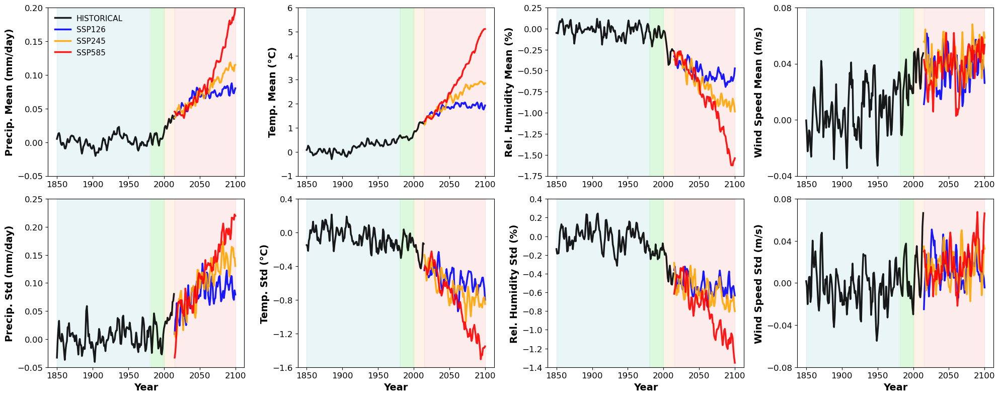

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

# Variables to plot
variables = ['pr_hr', 'tas_hr', 'hurs_hr', 'sfcWind_hr']
var_names = ['Precip.', 'Temp.', 'Rel. Humidity', 'Wind Speed']
var_units = ['mm/day', '°C', '%', 'm/s']

# Define y-axis limits and tick spacing for each variable
# Format: [mean_anomaly_limits, mean_anomaly_tick, std_anomaly_limits, std_anomaly_tick]
ylim_config = {
    'pr_hr': [(-0.05, 0.20), 0.05, (-0.05, 0.25), 0.05],
    'tas_hr': [(-1, 6), 1, (-1.6, 0.4), 0.4],
    'hurs_hr': [(-1.75, 0.25), 0.25, (-1.4, 0.4), 0.2],
    'sfcWind_hr': [(-0.04, 0.08), 0.04, (-0.08, 0.08), 0.04]
}

# Define time periods for shading
time_periods = [
    (1850, 1980, 'lightblue', 0.25),
    (1981, 2000, 'lightgreen', 0.3),
    (2001, 2014, 'peachpuff', 0.3),
    (2015, 2100, 'lightcoral', 0.15)
]

# Calculate simple global mean (no weighting)
def calc_global_mean(ds, var):
    """Calculate simple global mean without area weighting"""
    data = ds[var].values  # Convert to numpy array first
    
    # Simple spatial mean (axis 1=lat, axis 2=lon)
    mean = np.mean(data, axis=(1, 2))
    
    return mean

# Calculate spatial standard deviation
def calc_spatial_std(ds, var):
    """Calculate spatial standard deviation at each time point"""
    data = ds[var].values  # Convert to numpy array first
    
    # Spatial std at each time (axis 1=lat, axis 2=lon)
    spatial_std = np.std(data, axis=(1, 2))
    
    return spatial_std

# Calculate baseline for a period (not just single year)
def calc_baseline(ds, var, start_year=1850, end_year=1900, stat='mean'):
    """Calculate baseline mean or std for reference period"""
    data = ds[var]
    years = ds.time.dt.year
    
    # Select reference period
    mask = (years >= start_year) & (years <= end_year)
    baseline_data = data.isel(time=mask)
    
    if stat == 'mean':
        # Calculate mean over reference period and space
        baseline = baseline_data.mean(dim=['time', 'lat', 'lon'])
    elif stat == 'std':
        # First calculate spatial std at each time, then average over time
        spatial_std = baseline_data.std(dim=['lat', 'lon'])
        baseline = spatial_std.mean(dim='time')
    
    return baseline

# Convert to annual averages
def to_annual_mean(data, years):
    """Convert monthly/sub-annual data to annual averages"""
    df = pd.DataFrame({'year': years, 'value': data})
    annual = df.groupby('year')['value'].mean()
    return annual.index.values, annual.values

# Smooth annual data with rolling window
def smooth_data(data, window):
    """Apply rolling mean to annual data"""
    df = pd.Series(data)
    smoothed = df.rolling(window=window, center=True, min_periods=1).mean()
    return smoothed.values

# Create figure with 2 rows and 4 columns
# Row 0: Mean, Row 1: Std
fig, axes = plt.subplots(2, 4, figsize=(20, 8))

# Colors for scenarios
colors = {'historical': 'black', 'ssp126': 'blue', 'ssp245': 'orange', 'ssp585': 'red'}

# Define baseline period (using climate science standard)
baseline_start = 1850
baseline_end = 1900

# Process each variable
for i, (var_hr, var_name, unit) in enumerate(zip(variables, var_names, var_units)):
    # Calculate baseline mean from historical data (for HR)
    baseline_mean = calc_baseline(ds_hist, var_hr, start_year=baseline_start, 
                                   end_year=baseline_end, stat='mean')
    
    # Calculate baseline std from historical data (for HR)
    baseline_std = calc_baseline(ds_hist, var_hr, start_year=baseline_start, 
                                 end_year=baseline_end, stat='std')
    
    # Plot each scenario
    for scenario, ds, color in [
        ('historical', ds_hist, colors['historical']),
        ('ssp126', ds_ssp126, colors['ssp126']),
        ('ssp245', ds_ssp245, colors['ssp245']),
        ('ssp585', ds_ssp585, colors['ssp585'])
    ]:
        # Get global mean time series for HR
        mean_ts_np = calc_global_mean(ds, var_hr)
        
        # Calculate mean anomaly relative to baseline period
        mean_anomaly_ts = mean_ts_np - float(baseline_mean.values)
        
        # Get spatial standard deviation time series for HR
        spatial_std_np = calc_spatial_std(ds, var_hr)
        
        # Calculate std anomaly relative to baseline period
        std_anomaly_ts = spatial_std_np - float(baseline_std.values)
        
        # Get years for x-axis
        years = ds.time.dt.year.values
        
        # Convert to annual averages first
        annual_years_mean, annual_mean_anomaly = to_annual_mean(mean_anomaly_ts, years)
        annual_years_std, annual_std_anomaly = to_annual_mean(std_anomaly_ts, years)
        
        # Apply rolling window to annual data (3-year window)
        window_annual = 3  # 3 years rolling window on annual data
        
        mean_anomaly_smooth = smooth_data(annual_mean_anomaly, window_annual)
        std_anomaly_smooth = smooth_data(annual_std_anomaly, window_annual)
        
        # Plot Row 0, Column i: Mean Anomaly
        axes[0, i].plot(annual_years_mean, mean_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
        
        # Plot Row 1, Column i: Std Anomaly
        axes[1, i].plot(annual_years_std, std_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
    
    # Get y-axis configuration for this variable
    mean_ylim, mean_tick, std_ylim, std_tick = ylim_config[var_hr]
    
    # Format Row 0 (Mean)
    ax_mean = axes[0, i]
    for start_year, end_year, color_shade, alpha in time_periods:
        ax_mean.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)
    ax_mean.set_ylabel(f'{var_name} Mean ({unit})', fontsize=14, fontweight='bold')
    ax_mean.set_ylim(mean_ylim)
    ax_mean.set_yticks(np.arange(mean_ylim[0], mean_ylim[1] + mean_tick/2, mean_tick))
    ax_mean.tick_params(labelsize=12)
    if i == 0:
        legend = ax_mean.legend(loc='best', fontsize=11, frameon=False)
    
    # Format Row 1 (Std)
    ax_std = axes[1, i]
    for start_year, end_year, color_shade, alpha in time_periods:
        ax_std.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)
    ax_std.set_ylabel(f'{var_name} Std ({unit})', fontsize=14, fontweight='bold')
    ax_std.set_xlabel('Year', fontsize=14, fontweight='bold')
    ax_std.set_ylim(std_ylim)
    ax_std.set_yticks(np.arange(std_ylim[0], std_ylim[1] + std_tick/2, std_tick))
    ax_std.tick_params(labelsize=12)

plt.tight_layout()
plt.show()

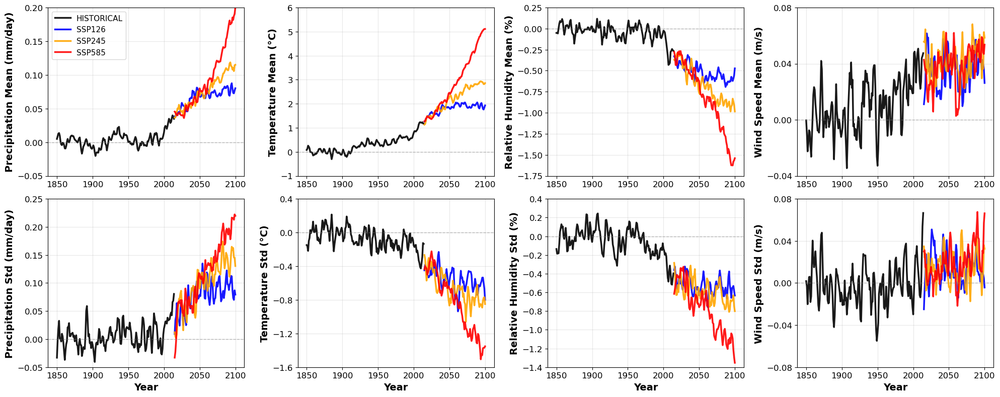

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

# Variables to plot
variables = ['pr_hr', 'tas_hr', 'hurs_hr', 'sfcWind_hr']
var_names = ['Precipitation', 'Temperature', 'Relative Humidity', 'Wind Speed']
var_units = ['mm/day', '°C', '%', 'm/s']

# Define y-axis limits and tick spacing for each variable
# Format: [mean_anomaly_limits, mean_anomaly_tick, std_anomaly_limits, std_anomaly_tick]
ylim_config = {
    'pr_hr': [(-0.05, 0.20), 0.05, (-0.05, 0.25), 0.05],
    'tas_hr': [(-1, 6), 1, (-1.6, 0.4), 0.4],
    'hurs_hr': [(-1.75, 0.25), 0.25, (-1.4, 0.4), 0.2],
    'sfcWind_hr': [(-0.04, 0.08), 0.04, (-0.08, 0.08), 0.04]
}

# Calculate simple global mean (no weighting)
def calc_global_mean(ds, var):
    """Calculate simple global mean without area weighting"""
    data = ds[var].values  # Convert to numpy array first
    
    # Simple spatial mean (axis 1=lat, axis 2=lon)
    mean = np.mean(data, axis=(1, 2))
    
    return mean

# Calculate spatial standard deviation
def calc_spatial_std(ds, var):
    """Calculate spatial standard deviation at each time point"""
    data = ds[var].values  # Convert to numpy array first
    
    # Spatial std at each time (axis 1=lat, axis 2=lon)
    spatial_std = np.std(data, axis=(1, 2))
    
    return spatial_std

# Calculate baseline for a period (not just single year)
def calc_baseline(ds, var, start_year=1850, end_year=1900, stat='mean'):
    """Calculate baseline mean or std for reference period"""
    data = ds[var]
    years = ds.time.dt.year
    
    # Select reference period
    mask = (years >= start_year) & (years <= end_year)
    baseline_data = data.isel(time=mask)
    
    if stat == 'mean':
        # Calculate mean over reference period and space
        baseline = baseline_data.mean(dim=['time', 'lat', 'lon'])
    elif stat == 'std':
        # First calculate spatial std at each time, then average over time
        spatial_std = baseline_data.std(dim=['lat', 'lon'])
        baseline = spatial_std.mean(dim='time')
    
    return baseline

# Convert to annual averages
def to_annual_mean(data, years):
    """Convert monthly/sub-annual data to annual averages"""
    df = pd.DataFrame({'year': years, 'value': data})
    annual = df.groupby('year')['value'].mean()
    return annual.index.values, annual.values

# Smooth annual data with rolling window
def smooth_data(data, window):
    """Apply rolling mean to annual data"""
    df = pd.Series(data)
    smoothed = df.rolling(window=window, center=True, min_periods=1).mean()
    return smoothed.values

# Create figure with 2 rows (mean in row 0, std in row 1) and 4 columns (one per variable)
fig, axes = plt.subplots(2, 4, figsize=(20, 8))

# Colors for scenarios
colors = {'historical': 'black', 'ssp126': 'blue', 'ssp245': 'orange', 'ssp585': 'red'}

# Define baseline period (using climate science standard)
baseline_start = 1850
baseline_end = 1900

# Process each variable
for i, (var, var_name, unit) in enumerate(zip(variables, var_names, var_units)):
    # Calculate baseline mean from historical data
    baseline_mean = calc_baseline(ds_hist, var, start_year=baseline_start, 
                                   end_year=baseline_end, stat='mean')
    
    # Calculate baseline std from historical data
    baseline_std = calc_baseline(ds_hist, var, start_year=baseline_start, 
                                 end_year=baseline_end, stat='std')
    
    # Plot each scenario
    for scenario, ds, color in [
        ('historical', ds_hist, colors['historical']),
        ('ssp126', ds_ssp126, colors['ssp126']),
        ('ssp245', ds_ssp245, colors['ssp245']),
        ('ssp585', ds_ssp585, colors['ssp585'])
    ]:
        # Get global mean time series (already numpy array)
        mean_ts_np = calc_global_mean(ds, var)
        
        # Calculate mean anomaly relative to baseline period
        mean_anomaly_ts = mean_ts_np - float(baseline_mean.values)
        
        # Get spatial standard deviation time series (already numpy array)
        spatial_std_np = calc_spatial_std(ds, var)
        
        # Calculate std anomaly relative to baseline period
        std_anomaly_ts = spatial_std_np - float(baseline_std.values)
        
        # Get years for x-axis
        years = ds.time.dt.year.values
        
        # Convert to annual averages first
        annual_years_mean, annual_mean_anomaly = to_annual_mean(mean_anomaly_ts, years)
        annual_years_std, annual_std_anomaly = to_annual_mean(std_anomaly_ts, years)
        
        # Apply rolling window to annual data (3-year window)
        window_annual = 3  # 3 years rolling window on annual data
        
        mean_anomaly_smooth = smooth_data(annual_mean_anomaly, window_annual)
        std_anomaly_smooth = smooth_data(annual_std_anomaly, window_annual)
        
        # Plot Row 0, Column i: Mean Anomaly
        axes[0, i].plot(annual_years_mean, mean_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
        
        # Plot Row 1, Column i: Std Anomaly
        axes[1, i].plot(annual_years_std, std_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
    
    # Get y-axis configuration for this variable
    mean_ylim, mean_tick, std_ylim, std_tick = ylim_config[var]
    
    # Format Row 0 (Mean)
    ax_mean = axes[0, i]
    ax_mean.set_ylabel(f'{var_name} Mean ({unit})', fontsize=14, fontweight='bold')
    ax_mean.set_ylim(mean_ylim)
    ax_mean.set_yticks(np.arange(mean_ylim[0], mean_ylim[1] + mean_tick/2, mean_tick))
    ax_mean.axhline(y=0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    ax_mean.grid(True, alpha=0.3)
    ax_mean.tick_params(labelsize=12)
    if i == 0:
        ax_mean.legend(loc='best', fontsize=11)
    
    # Format Row 1 (Std)
    ax_std = axes[1, i]
    ax_std.set_ylabel(f'{var_name} Std ({unit})', fontsize=14, fontweight='bold')
    ax_std.set_xlabel('Year', fontsize=14, fontweight='bold')
    ax_std.set_ylim(std_ylim)
    ax_std.set_yticks(np.arange(std_ylim[0], std_ylim[1] + std_tick/2, std_tick))
    ax_std.axhline(y=0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
    ax_std.grid(True, alpha=0.3)
    ax_std.tick_params(labelsize=12)

plt.tight_layout()
plt.show()

# Evolution of Mean and Std of Residual Data

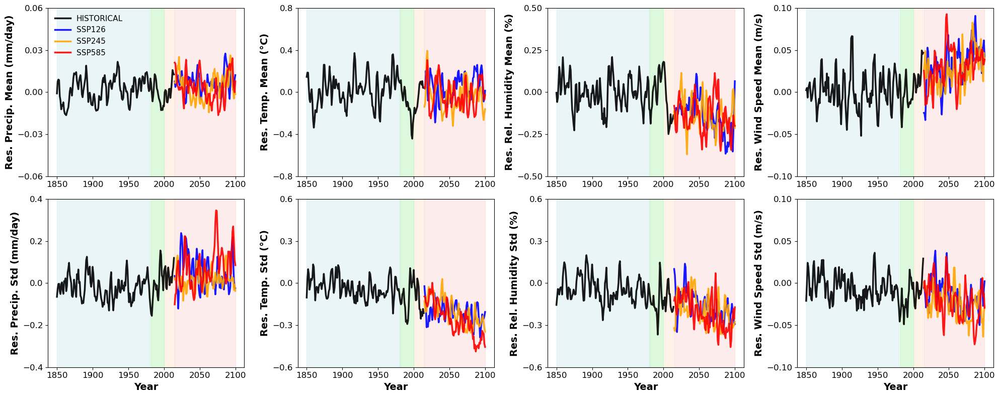

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

# Variables to plot
variables = ['pr_hr', 'tas_hr', 'hurs_hr', 'sfcWind_hr']
variables_lr = ['pr_lr_interp', 'tas_lr_interp', 'hurs_lr_interp', 'sfcWind_lr_interp']
var_names = ['Precip.', 'Temp.', 'Rel. Humidity', 'Wind Speed']
var_units = ['mm/day', '°C', '%', 'm/s']

# Define y-axis limits and tick spacing for residuals
# Format: [residual_mean_limits, residual_mean_tick, residual_std_limits, residual_std_tick]
ylim_config_residual = {
    'pr_hr': [(-0.06, 0.06), 0.03, (-0.4, 0.4), 0.2],
    'tas_hr': [(-0.8, 0.8), 0.4, (-0.6, 0.6), 0.3],
    'hurs_hr': [(-0.5, 0.5), 0.25, (-0.6, 0.6), 0.3],
    'sfcWind_hr': [(-0.1, 0.1), 0.05, (-0.1, 0.1), 0.05]
}

# Define time periods for shading
time_periods = [
    (1850, 1980, 'lightblue', 0.25),
    (1981, 2000, 'lightgreen', 0.3),
    (2001, 2014, 'peachpuff', 0.3),
    (2015, 2100, 'lightcoral', 0.15)
]

# Calculate simple global mean (no weighting)
def calc_global_mean(ds, var):
    """Calculate simple global mean without area weighting"""
    data = ds[var].values  # Convert to numpy array first
    
    # Simple spatial mean (axis 1=lat, axis 2=lon)
    mean = np.mean(data, axis=(1, 2))
    
    return mean

# Calculate spatial standard deviation
def calc_spatial_std(ds, var):
    """Calculate spatial standard deviation at each time point"""
    data = ds[var].values  # Convert to numpy array first
    
    # Spatial std at each time (axis 1=lat, axis 2=lon)
    spatial_std = np.std(data, axis=(1, 2))
    
    return spatial_std

# Convert to annual averages
def to_annual_mean(data, years):
    """Convert monthly/sub-annual data to annual averages"""
    df = pd.DataFrame({'year': years, 'value': data})
    annual = df.groupby('year')['value'].mean()
    return annual.index.values, annual.values

# Smooth annual data with rolling window
def smooth_data(data, window):
    """Apply rolling mean to annual data"""
    df = pd.Series(data)
    smoothed = df.rolling(window=window, center=True, min_periods=1).mean()
    return smoothed.values

# Create figure with 2 rows and 4 columns
# Row 0: Residual Mean, Row 1: Residual Std
fig, axes = plt.subplots(2, 4, figsize=(20, 8))

# Colors for scenarios
colors = {'historical': 'black', 'ssp126': 'blue', 'ssp245': 'orange', 'ssp585': 'red'}

# Define baseline period (using climate science standard)
baseline_start = 1850
baseline_end = 1900

# Process each variable
for i, (var_hr, var_lr, var_name, unit) in enumerate(zip(variables, variables_lr, var_names, var_units)):
    # Calculate baseline for residual (HR - LR)
    # First calculate residual at each time point for historical data
    hr_data_hist = ds_hist[var_hr]
    lr_data_hist = ds_hist[var_lr]
    residual_hist = hr_data_hist - lr_data_hist
    
    # Calculate baseline mean and std for residual
    years_hist = ds_hist.time.dt.year
    mask_baseline = (years_hist >= baseline_start) & (years_hist <= baseline_end)
    residual_baseline_data = residual_hist.isel(time=mask_baseline)
    baseline_residual_mean = residual_baseline_data.mean(dim=['time', 'lat', 'lon'])
    residual_baseline_std_temporal = residual_baseline_data.std(dim=['lat', 'lon'])
    baseline_residual_std = residual_baseline_std_temporal.mean(dim='time')
    
    # Plot each scenario
    for scenario, ds, color in [
        ('historical', ds_hist, colors['historical']),
        ('ssp126', ds_ssp126, colors['ssp126']),
        ('ssp245', ds_ssp245, colors['ssp245']),
        ('ssp585', ds_ssp585, colors['ssp585'])
    ]:
        # Calculate residual (HR - LR)
        hr_data = ds[var_hr].values
        lr_data = ds[var_lr].values
        residual_data = hr_data - lr_data
        
        # Calculate mean and std for residual
        residual_mean_ts = np.mean(residual_data, axis=(1, 2))
        residual_std_ts = np.std(residual_data, axis=(1, 2))
        
        # Calculate residual anomalies
        residual_mean_anomaly_ts = residual_mean_ts - float(baseline_residual_mean.values)
        residual_std_anomaly_ts = residual_std_ts - float(baseline_residual_std.values)
        
        # Get years for x-axis
        years = ds.time.dt.year.values
        
        # Convert to annual averages first
        annual_years_res_mean, annual_res_mean_anomaly = to_annual_mean(residual_mean_anomaly_ts, years)
        annual_years_res_std, annual_res_std_anomaly = to_annual_mean(residual_std_anomaly_ts, years)
        
        # Apply rolling window to annual data (3-year window)
        window_annual = 3  # 3 years rolling window on annual data
        
        res_mean_anomaly_smooth = smooth_data(annual_res_mean_anomaly, window_annual)
        res_std_anomaly_smooth = smooth_data(annual_res_std_anomaly, window_annual)
        
        # Plot Row 0, Column i: Residual Mean Anomaly
        axes[0, i].plot(annual_years_res_mean, res_mean_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
        
        # Plot Row 1, Column i: Residual Std Anomaly
        axes[1, i].plot(annual_years_res_std, res_std_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
    
    # Get y-axis configuration for this variable
    res_mean_ylim, res_mean_tick, res_std_ylim, res_std_tick = ylim_config_residual[var_hr]
    
    # Format Row 0 (Residual Mean)
    ax_res_mean = axes[0, i]
    for start_year, end_year, color_shade, alpha in time_periods:
        ax_res_mean.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)
    ax_res_mean.set_ylabel(f'Res. {var_name} Mean ({unit})', fontsize=14, fontweight='bold')
    ax_res_mean.set_ylim(res_mean_ylim)
    ax_res_mean.set_yticks(np.arange(res_mean_ylim[0], res_mean_ylim[1] + res_mean_tick/2, res_mean_tick))
    ax_res_mean.tick_params(labelsize=12)
    if i == 0:
        legend = ax_res_mean.legend(loc='best', fontsize=11, frameon=False)
    
    # Format Row 1 (Residual Std)
    ax_res_std = axes[1, i]
    for start_year, end_year, color_shade, alpha in time_periods:
        ax_res_std.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)
    ax_res_std.set_ylabel(f'Res. {var_name} Std ({unit})', fontsize=14, fontweight='bold')
    ax_res_std.set_xlabel('Year', fontsize=14, fontweight='bold')
    ax_res_std.set_ylim(res_std_ylim)
    ax_res_std.set_yticks(np.arange(res_std_ylim[0], res_std_ylim[1] + res_std_tick/2, res_std_tick))
    ax_res_std.tick_params(labelsize=12)

plt.tight_layout()
plt.show()

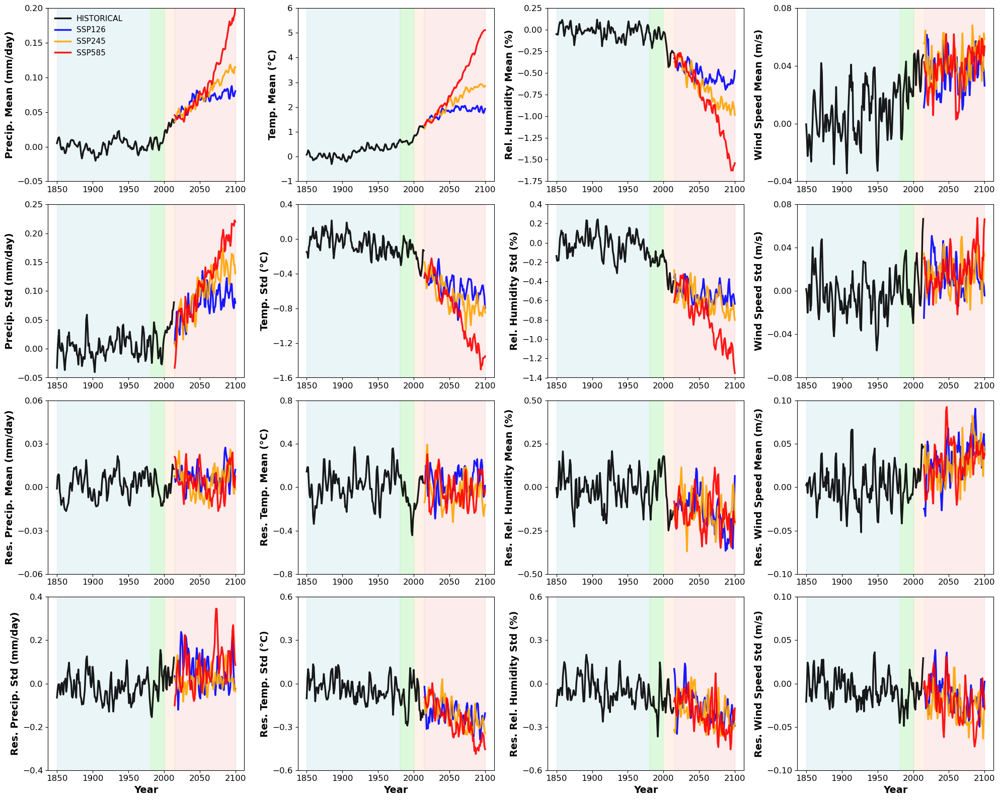

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

# Variables to plot
variables = ['pr_hr', 'tas_hr', 'hurs_hr', 'sfcWind_hr']
variables_lr = ['pr_lr_interp', 'tas_lr_interp', 'hurs_lr_interp', 'sfcWind_lr_interp']
var_names = ['Precip.', 'Temp.', 'Rel. Humidity', 'Wind Speed']
var_units = ['mm/day', '°C', '%', 'm/s']

# Define y-axis limits and tick spacing for each variable
# Format: [mean_anomaly_limits, mean_anomaly_tick, std_anomaly_limits, std_anomaly_tick, 
#          residual_mean_limits, residual_mean_tick, residual_std_limits, residual_std_tick]
ylim_config = {
    'pr_hr': [(-0.05, 0.20), 0.05, (-0.05, 0.25), 0.05, 
              (-0.06, 0.06), 0.03, (-0.4, 0.4), 0.2],
    'tas_hr': [(-1, 6), 1, (-1.6, 0.4), 0.4,
               (-0.8, 0.8), 0.4, (-0.6, 0.6), 0.3],
    'hurs_hr': [(-1.75, 0.25), 0.25, (-1.4, 0.4), 0.2,
                (-0.5, 0.5), 0.25, (-0.6, 0.6), 0.3],
    'sfcWind_hr': [(-0.04, 0.08), 0.04, (-0.08, 0.08), 0.04,
                   (-0.1, 0.1), 0.05, (-0.1, 0.1), 0.05]
}

# Define time periods for shading
time_periods = [
    (1850, 1980, 'lightblue', 0.25),
    (1981, 2000, 'lightgreen', 0.3),
    (2001, 2014, 'peachpuff', 0.3),
    (2015, 2100, 'lightcoral', 0.15)
]

# Calculate simple global mean (no weighting)
def calc_global_mean(ds, var):
    """Calculate simple global mean without area weighting"""
    data = ds[var].values  # Convert to numpy array first
    
    # Simple spatial mean (axis 1=lat, axis 2=lon)
    mean = np.mean(data, axis=(1, 2))
    
    return mean

# Calculate spatial standard deviation
def calc_spatial_std(ds, var):
    """Calculate spatial standard deviation at each time point"""
    data = ds[var].values  # Convert to numpy array first
    
    # Spatial std at each time (axis 1=lat, axis 2=lon)
    spatial_std = np.std(data, axis=(1, 2))
    
    return spatial_std

# Calculate baseline for a period (not just single year)
def calc_baseline(ds, var, start_year=1850, end_year=1900, stat='mean'):
    """Calculate baseline mean or std for reference period"""
    data = ds[var]
    years = ds.time.dt.year
    
    # Select reference period
    mask = (years >= start_year) & (years <= end_year)
    baseline_data = data.isel(time=mask)
    
    if stat == 'mean':
        # Calculate mean over reference period and space
        baseline = baseline_data.mean(dim=['time', 'lat', 'lon'])
    elif stat == 'std':
        # First calculate spatial std at each time, then average over time
        spatial_std = baseline_data.std(dim=['lat', 'lon'])
        baseline = spatial_std.mean(dim='time')
    
    return baseline

# Convert to annual averages
def to_annual_mean(data, years):
    """Convert monthly/sub-annual data to annual averages"""
    df = pd.DataFrame({'year': years, 'value': data})
    annual = df.groupby('year')['value'].mean()
    return annual.index.values, annual.values

# Smooth annual data with rolling window
def smooth_data(data, window):
    """Apply rolling mean to annual data"""
    df = pd.Series(data)
    smoothed = df.rolling(window=window, center=True, min_periods=1).mean()
    return smoothed.values

# Create figure with 4 rows and 4 columns
# Row 0: Mean, Row 1: Std, Row 2: Residual Mean, Row 3: Residual Std
fig, axes = plt.subplots(4, 4, figsize=(20, 16))

# Colors for scenarios
colors = {'historical': 'black', 'ssp126': 'blue', 'ssp245': 'orange', 'ssp585': 'red'}

# Define baseline period (using climate science standard)
baseline_start = 1850
baseline_end = 1900

# Process each variable
for i, (var_hr, var_lr, var_name, unit) in enumerate(zip(variables, variables_lr, var_names, var_units)):
    # Calculate baseline mean from historical data (for HR)
    baseline_mean = calc_baseline(ds_hist, var_hr, start_year=baseline_start, 
                                   end_year=baseline_end, stat='mean')
    
    # Calculate baseline std from historical data (for HR)
    baseline_std = calc_baseline(ds_hist, var_hr, start_year=baseline_start, 
                                 end_year=baseline_end, stat='std')
    
    # Calculate baseline for residual (HR - LR)
    # First calculate residual at each time point for historical data
    hr_data_hist = ds_hist[var_hr]
    lr_data_hist = ds_hist[var_lr]
    residual_hist = hr_data_hist - lr_data_hist
    
    # Calculate baseline mean and std for residual
    years_hist = ds_hist.time.dt.year
    mask_baseline = (years_hist >= baseline_start) & (years_hist <= baseline_end)
    residual_baseline_data = residual_hist.isel(time=mask_baseline)
    baseline_residual_mean = residual_baseline_data.mean(dim=['time', 'lat', 'lon'])
    residual_baseline_std_temporal = residual_baseline_data.std(dim=['lat', 'lon'])
    baseline_residual_std = residual_baseline_std_temporal.mean(dim='time')
    
    # Plot each scenario
    for scenario, ds, color in [
        ('historical', ds_hist, colors['historical']),
        ('ssp126', ds_ssp126, colors['ssp126']),
        ('ssp245', ds_ssp245, colors['ssp245']),
        ('ssp585', ds_ssp585, colors['ssp585'])
    ]:
        # Get global mean time series for HR
        mean_ts_np = calc_global_mean(ds, var_hr)
        
        # Calculate mean anomaly relative to baseline period
        mean_anomaly_ts = mean_ts_np - float(baseline_mean.values)
        
        # Get spatial standard deviation time series for HR
        spatial_std_np = calc_spatial_std(ds, var_hr)
        
        # Calculate std anomaly relative to baseline period
        std_anomaly_ts = spatial_std_np - float(baseline_std.values)
        
        # Calculate residual (HR - LR)
        hr_data = ds[var_hr].values
        lr_data = ds[var_lr].values
        residual_data = hr_data - lr_data
        
        # Calculate mean and std for residual
        residual_mean_ts = np.mean(residual_data, axis=(1, 2))
        residual_std_ts = np.std(residual_data, axis=(1, 2))
        
        # Calculate residual anomalies
        residual_mean_anomaly_ts = residual_mean_ts - float(baseline_residual_mean.values)
        residual_std_anomaly_ts = residual_std_ts - float(baseline_residual_std.values)
        
        # Get years for x-axis
        years = ds.time.dt.year.values
        
        # Convert to annual averages first
        annual_years_mean, annual_mean_anomaly = to_annual_mean(mean_anomaly_ts, years)
        annual_years_std, annual_std_anomaly = to_annual_mean(std_anomaly_ts, years)
        annual_years_res_mean, annual_res_mean_anomaly = to_annual_mean(residual_mean_anomaly_ts, years)
        annual_years_res_std, annual_res_std_anomaly = to_annual_mean(residual_std_anomaly_ts, years)
        
        # Apply rolling window to annual data (3-year window)
        window_annual = 3  # 3 years rolling window on annual data
        
        mean_anomaly_smooth = smooth_data(annual_mean_anomaly, window_annual)
        std_anomaly_smooth = smooth_data(annual_std_anomaly, window_annual)
        res_mean_anomaly_smooth = smooth_data(annual_res_mean_anomaly, window_annual)
        res_std_anomaly_smooth = smooth_data(annual_res_std_anomaly, window_annual)
        
        # Plot Row 0, Column i: Mean Anomaly
        axes[0, i].plot(annual_years_mean, mean_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
        
        # Plot Row 1, Column i: Std Anomaly
        axes[1, i].plot(annual_years_std, std_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
        
        # Plot Row 2, Column i: Residual Mean Anomaly
        axes[2, i].plot(annual_years_res_mean, res_mean_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
        
        # Plot Row 3, Column i: Residual Std Anomaly
        axes[3, i].plot(annual_years_res_std, res_std_anomaly_smooth, color=color, 
                        label=scenario.upper(), linewidth=2.5, alpha=0.9)
    
    # Get y-axis configuration for this variable
    mean_ylim, mean_tick, std_ylim, std_tick, res_mean_ylim, res_mean_tick, res_std_ylim, res_std_tick = ylim_config[var_hr]
    
    # Format Row 0 (Mean)
    ax_mean = axes[0, i]
    for start_year, end_year, color_shade, alpha in time_periods:
        ax_mean.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)
    ax_mean.set_ylabel(f'{var_name} Mean ({unit})', fontsize=14, fontweight='bold')
    ax_mean.set_ylim(mean_ylim)
    ax_mean.set_yticks(np.arange(mean_ylim[0], mean_ylim[1] + mean_tick/2, mean_tick))
    ax_mean.tick_params(labelsize=12)
    if i == 0:
        legend = ax_mean.legend(loc='best', fontsize=11, frameon=False)
    
    # Format Row 1 (Std)
    ax_std = axes[1, i]
    for start_year, end_year, color_shade, alpha in time_periods:
        ax_std.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)
    ax_std.set_ylabel(f'{var_name} Std ({unit})', fontsize=14, fontweight='bold')
    ax_std.set_ylim(std_ylim)
    ax_std.set_yticks(np.arange(std_ylim[0], std_ylim[1] + std_tick/2, std_tick))
    ax_std.tick_params(labelsize=12)
    
    # Format Row 2 (Residual Mean)
    ax_res_mean = axes[2, i]
    for start_year, end_year, color_shade, alpha in time_periods:
        ax_res_mean.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)
    ax_res_mean.set_ylabel(f'Res. {var_name} Mean ({unit})', fontsize=14, fontweight='bold')
    ax_res_mean.set_ylim(res_mean_ylim)
    ax_res_mean.set_yticks(np.arange(res_mean_ylim[0], res_mean_ylim[1] + res_mean_tick/2, res_mean_tick))
    ax_res_mean.tick_params(labelsize=12)
    
    # Format Row 3 (Residual Std)
    ax_res_std = axes[3, i]
    for start_year, end_year, color_shade, alpha in time_periods:
        ax_res_std.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)
    ax_res_std.set_ylabel(f'Res. {var_name} Std ({unit})', fontsize=14, fontweight='bold')
    ax_res_std.set_xlabel('Year', fontsize=14, fontweight='bold')
    ax_res_std.set_ylim(res_std_ylim)
    ax_res_std.set_yticks(np.arange(res_std_ylim[0], res_std_ylim[1] + res_std_tick/2, res_std_tick))
    ax_res_std.tick_params(labelsize=12)

plt.tight_layout()
plt.show()

# Detrend Gridpoint

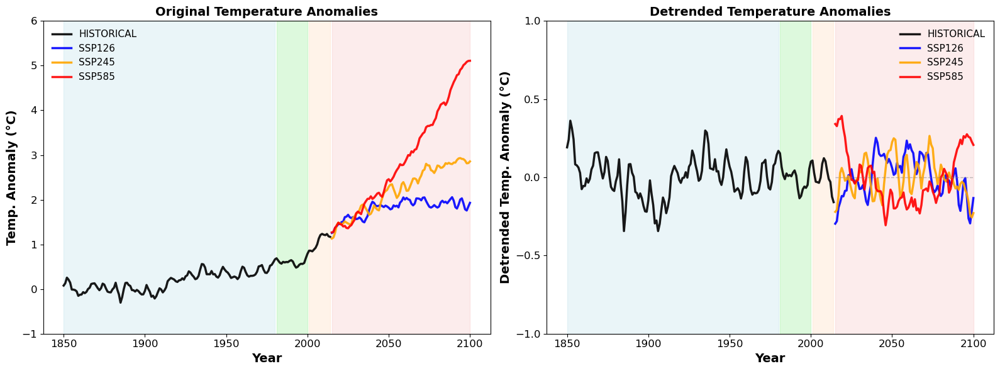

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

# Define time periods for detrending
time_periods = [
    (1850, 1980),
    (1981, 2000),
    (2001, 2014),
    (2015, 2100)
]

# Define time periods for shading
shade_periods = [
    (1850, 1980, 'lightblue', 0.25),
    (1981, 2000, 'lightgreen', 0.3),
    (2001, 2014, 'peachpuff', 0.3),
    (2015, 2100, 'lightcoral', 0.15)
]

def detrend_gridpoint_by_period(data_3d, years, time_periods):
    """
    Detrend each grid point separately for each time period using vectorized linear regression.
    
    Parameters:
    -----------
    data_3d : numpy array of shape (time, lat, lon)
        The data to detrend
    years : numpy array of shape (time,)
        Year values for each time step
    time_periods : list of tuples
        Each tuple is (start_year, end_year) defining a period to detrend
    
    Returns:
    --------
    detrended_data : numpy array of shape (time, lat, lon)
        The detrended data
    """
    n_time, n_lat, n_lon = data_3d.shape
    detrended_data = np.zeros_like(data_3d)
    
    for start_year, end_year in time_periods:
        # Find time indices for this period
        mask = (years >= start_year) & (years <= end_year)
        time_indices = np.where(mask)[0]
        
        if len(time_indices) == 0:
            continue
        
        # Extract data for this period
        period_data = data_3d[mask, :, :]  # shape: (n_time_period, n_lat, n_lon)
        n_time_period = period_data.shape[0]
        
        # Create time array (normalized to start at 0)
        t = np.arange(n_time_period).astype(float)
        
        # Vectorized linear regression for all grid points at once
        # Reshape data: (n_time_period, n_lat, n_lon) -> (n_time_period, n_lat*n_lon)
        data_reshaped = period_data.reshape(n_time_period, -1)
        
        # Calculate means
        t_mean = np.mean(t)
        data_mean = np.mean(data_reshaped, axis=0)  # shape: (n_lat*n_lon,)
        
        # Calculate slope (b) for all grid points at once
        # b = Σ[(t - t_mean) * (y - y_mean)] / Σ[(t - t_mean)^2]
        t_centered = t - t_mean  # shape: (n_time_period,)
        data_centered = data_reshaped - data_mean  # shape: (n_time_period, n_lat*n_lon)
        
        numerator = np.sum(t_centered[:, np.newaxis] * data_centered, axis=0)  # shape: (n_lat*n_lon,)
        denominator = np.sum(t_centered**2)  # scalar
        
        b = numerator / denominator  # shape: (n_lat*n_lon,)
        
        # Calculate intercept (a) for all grid points
        # a = y_mean - b * t_mean
        a = data_mean - b * t_mean  # shape: (n_lat*n_lon,)
        
        # Calculate fitted trend for all grid points
        # trend = a + b * t
        # Need to broadcast: a is (n_lat*n_lon,), b is (n_lat*n_lon,), t is (n_time_period,)
        # Result should be (n_time_period, n_lat*n_lon)
        trend = a[np.newaxis, :] + b[np.newaxis, :] * t[:, np.newaxis]  # shape: (n_time_period, n_lat*n_lon)
        
        # Detrend: residuals = data - trend
        residuals = data_reshaped - trend  # shape: (n_time_period, n_lat*n_lon)
        
        # Reshape back to 3D
        residuals_3d = residuals.reshape(n_time_period, n_lat, n_lon)
        
        # Store in output array
        detrended_data[mask, :, :] = residuals_3d
    
    return detrended_data

# Convert to annual averages
def to_annual_mean(data, years):
    """Convert monthly/sub-annual data to annual averages"""
    df = pd.DataFrame({'year': years, 'value': data})
    annual = df.groupby('year')['value'].mean()
    return annual.index.values, annual.values

# Smooth annual data with rolling window
def smooth_data(data, window):
    """Apply rolling mean to annual data"""
    df = pd.Series(data)
    smoothed = df.rolling(window=window, center=True, min_periods=1).mean()
    return smoothed.values

# Calculate baseline for anomaly (1850-1900)
baseline_start = 1850
baseline_end = 1900

# Process temperature data
var = 'tas_hr'

# Create figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Colors for scenarios
colors = {'historical': 'black', 'ssp126': 'blue', 'ssp245': 'orange', 'ssp585': 'red'}

scenarios = [
    ('historical', ds_hist, colors['historical']),
    ('ssp126', ds_ssp126, colors['ssp126']),
    ('ssp245', ds_ssp245, colors['ssp245']),
    ('ssp585', ds_ssp585, colors['ssp585'])
]

# Calculate baseline from historical data
tas_hist = ds_hist[var]
years_hist = ds_hist.time.dt.year
mask_baseline = (years_hist >= baseline_start) & (years_hist <= baseline_end)
baseline_data = tas_hist.isel(time=mask_baseline)
baseline = baseline_data.mean(dim=['time', 'lat', 'lon']).values

for scenario_name, ds, color in scenarios:
    # Get temperature data
    tas_data = ds[var].values  # shape: (time, lat, lon)
    years = ds.time.dt.year.values
    
    # Calculate anomalies
    anomaly_data = tas_data - baseline
    
    # Detrend each grid point by period
    detrended_data = detrend_gridpoint_by_period(anomaly_data, years, time_periods)
    
    # Calculate global means (simple spatial average)
    global_mean_original = np.mean(anomaly_data, axis=(1, 2))
    global_mean_detrended = np.mean(detrended_data, axis=(1, 2))
    
    # Convert to annual averages
    annual_years_orig, annual_mean_orig = to_annual_mean(global_mean_original, years)
    annual_years_detr, annual_mean_detr = to_annual_mean(global_mean_detrended, years)
    
    # Apply 3-year rolling mean
    window_annual = 3
    smoothed_original = smooth_data(annual_mean_orig, window_annual)
    smoothed_detrended = smooth_data(annual_mean_detr, window_annual)
    
    # Plot original anomalies in left panel
    axes[0].plot(annual_years_orig, smoothed_original, color=color, 
                 linewidth=2.5, alpha=0.9, label=scenario_name.upper())
    
    # Plot detrended anomalies in right panel
    axes[1].plot(annual_years_detr, smoothed_detrended, color=color, 
                 linewidth=2.5, alpha=0.9, label=scenario_name.upper())

# Format left panel (Original)
ax_orig = axes[0]
for start_year, end_year, color_shade, alpha in shade_periods:
    ax_orig.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)

ax_orig.set_ylabel('Temp. Anomaly (°C)', fontsize=14, fontweight='bold')
ax_orig.set_xlabel('Year', fontsize=14, fontweight='bold')
ax_orig.set_title('Original Temperature Anomalies', fontsize=14, fontweight='bold')
ax_orig.tick_params(labelsize=12)
ax_orig.legend(loc='best', fontsize=11, frameon=False)
ax_orig.set_ylim(-1, 6)
ax_orig.set_yticks(np.arange(-1, 7, 1))

# Format right panel (Detrended)
ax_detr = axes[1]
for start_year, end_year, color_shade, alpha in shade_periods:
    ax_detr.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)

ax_detr.plot(annual_years_detr, np.zeros_like(annual_years_detr), 
             color='gray', linestyle='--', linewidth=1, alpha=0.5)
ax_detr.set_ylabel('Detrended Temp. Anomaly (°C)', fontsize=14, fontweight='bold')
ax_detr.set_xlabel('Year', fontsize=14, fontweight='bold')
ax_detr.set_title('Detrended Temperature Anomalies', fontsize=14, fontweight='bold')
ax_detr.tick_params(labelsize=12)
ax_detr.legend(loc='best', fontsize=11, frameon=False)
ax_detr.set_ylim(-1, 1)
ax_detr.set_yticks(np.arange(-1, 1.5, 0.5))

plt.tight_layout()
plt.show()

# Detrend Global

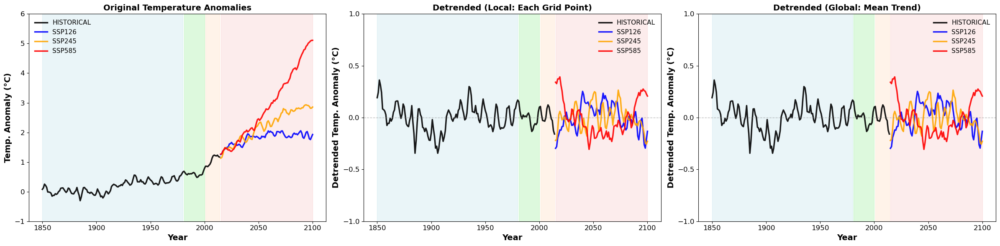

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

# Define time periods for detrending
time_periods = [
    (1850, 1980),
    (1981, 2000),
    (2001, 2014),
    (2015, 2100)
]

# Define time periods for shading
shade_periods = [
    (1850, 1980, 'lightblue', 0.25),
    (1981, 2000, 'lightgreen', 0.3),
    (2001, 2014, 'peachpuff', 0.3),
    (2015, 2100, 'lightcoral', 0.15)
]

def detrend_gridpoint_by_period(data_3d, years, time_periods):
    """
    Detrend each grid point separately for each time period using vectorized linear regression.
    (Local detrending approach)
    """
    n_time, n_lat, n_lon = data_3d.shape
    detrended_data = np.zeros_like(data_3d)
    
    for start_year, end_year in time_periods:
        mask = (years >= start_year) & (years <= end_year)
        time_indices = np.where(mask)[0]
        
        if len(time_indices) == 0:
            continue
        
        period_data = data_3d[mask, :, :]
        n_time_period = period_data.shape[0]
        t = np.arange(n_time_period).astype(float)
        data_reshaped = period_data.reshape(n_time_period, -1)
        
        t_mean = np.mean(t)
        data_mean = np.mean(data_reshaped, axis=0)
        
        t_centered = t - t_mean
        data_centered = data_reshaped - data_mean
        
        numerator = np.sum(t_centered[:, np.newaxis] * data_centered, axis=0)
        denominator = np.sum(t_centered**2)
        
        b = numerator / denominator
        a = data_mean - b * t_mean
        
        trend = a[np.newaxis, :] + b[np.newaxis, :] * t[:, np.newaxis]
        residuals = data_reshaped - trend
        residuals_3d = residuals.reshape(n_time_period, n_lat, n_lon)
        
        detrended_data[mask, :, :] = residuals_3d
    
    return detrended_data

def detrend_by_global_mean_trend(data_3d, years, time_periods):
    """
    Detrend by fitting linear regression to global mean time series,
    then broadcasting this trend to all grid points.
    (Global mean detrending approach)
    """
    n_time, n_lat, n_lon = data_3d.shape
    detrended_data = np.zeros_like(data_3d)
    
    for start_year, end_year in time_periods:
        mask = (years >= start_year) & (years <= end_year)
        time_indices = np.where(mask)[0]
        
        if len(time_indices) == 0:
            continue
        
        period_data = data_3d[mask, :, :]
        n_time_period = period_data.shape[0]
        
        # Step 1: Calculate global mean time series
        global_mean_ts = np.mean(period_data, axis=(1, 2))  # shape: (n_time_period,)
        
        # Step 2: Fit linear regression to global mean
        t = np.arange(n_time_period).astype(float)
        t_mean = np.mean(t)
        global_mean_mean = np.mean(global_mean_ts)
        
        t_centered = t - t_mean
        global_mean_centered = global_mean_ts - global_mean_mean
        
        # Calculate slope and intercept for global mean
        b_global = np.sum(t_centered * global_mean_centered) / np.sum(t_centered**2)
        a_global = global_mean_mean - b_global * t_mean
        
        # Step 3: Calculate the global mean trend
        global_trend = a_global + b_global * t  # shape: (n_time_period,)
        
        # Step 4: Broadcast this trend to all grid points and subtract
        # global_trend shape: (n_time_period,) -> (n_time_period, 1, 1)
        # period_data shape: (n_time_period, n_lat, n_lon)
        global_trend_broadcasted = global_trend[:, np.newaxis, np.newaxis]
        
        # Detrend by subtracting the global trend from all grid points
        detrended_period = period_data - global_trend_broadcasted
        
        detrended_data[mask, :, :] = detrended_period
    
    return detrended_data

# Convert to annual averages
def to_annual_mean(data, years):
    """Convert monthly/sub-annual data to annual averages"""
    df = pd.DataFrame({'year': years, 'value': data})
    annual = df.groupby('year')['value'].mean()
    return annual.index.values, annual.values

# Smooth annual data with rolling window
def smooth_data(data, window):
    """Apply rolling mean to annual data"""
    df = pd.Series(data)
    smoothed = df.rolling(window=window, center=True, min_periods=1).mean()
    return smoothed.values

# Calculate baseline for anomaly (1850-1900)
baseline_start = 1850
baseline_end = 1900

# Process temperature data
var = 'tas_hr'

# Create figure with 1 row and 3 columns
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# Colors for scenarios
colors = {'historical': 'black', 'ssp126': 'blue', 'ssp245': 'orange', 'ssp585': 'red'}

scenarios = [
    ('historical', ds_hist, colors['historical']),
    ('ssp126', ds_ssp126, colors['ssp126']),
    ('ssp245', ds_ssp245, colors['ssp245']),
    ('ssp585', ds_ssp585, colors['ssp585'])
]

# Calculate baseline from historical data
tas_hist = ds_hist[var]
years_hist = ds_hist.time.dt.year
mask_baseline = (years_hist >= baseline_start) & (years_hist <= baseline_end)
baseline_data = tas_hist.isel(time=mask_baseline)
baseline = baseline_data.mean(dim=['time', 'lat', 'lon']).values

for scenario_name, ds, color in scenarios:
    # Get temperature data
    tas_data = ds[var].values  # shape: (time, lat, lon)
    years = ds.time.dt.year.values
    
    # Calculate anomalies
    anomaly_data = tas_data - baseline
    
    # Approach 1: Detrend each grid point separately (local detrending)
    detrended_local = detrend_gridpoint_by_period(anomaly_data, years, time_periods)
    
    # Approach 2: Detrend by global mean trend (global detrending)
    detrended_global = detrend_by_global_mean_trend(anomaly_data, years, time_periods)
    
    # Calculate global means
    global_mean_original = np.mean(anomaly_data, axis=(1, 2))
    global_mean_detrended_local = np.mean(detrended_local, axis=(1, 2))
    global_mean_detrended_global = np.mean(detrended_global, axis=(1, 2))
    
    # Convert to annual averages
    annual_years_orig, annual_mean_orig = to_annual_mean(global_mean_original, years)
    annual_years_local, annual_mean_local = to_annual_mean(global_mean_detrended_local, years)
    annual_years_global, annual_mean_global = to_annual_mean(global_mean_detrended_global, years)
    
    # Apply 3-year rolling mean
    window_annual = 3
    smoothed_original = smooth_data(annual_mean_orig, window_annual)
    smoothed_local = smooth_data(annual_mean_local, window_annual)
    smoothed_global = smooth_data(annual_mean_global, window_annual)
    
    # Plot panel 0: Original anomalies
    axes[0].plot(annual_years_orig, smoothed_original, color=color, 
                 linewidth=2.5, alpha=0.9, label=scenario_name.upper())
    
    # Plot panel 1: Local detrending (each grid point)
    axes[1].plot(annual_years_local, smoothed_local, color=color, 
                 linewidth=2.5, alpha=0.9, label=scenario_name.upper())
    
    # Plot panel 2: Global mean detrending
    axes[2].plot(annual_years_global, smoothed_global, color=color, 
                 linewidth=2.5, alpha=0.9, label=scenario_name.upper())

# Format panel 0 (Original)
ax_orig = axes[0]
for start_year, end_year, color_shade, alpha in shade_periods:
    ax_orig.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)

ax_orig.set_ylabel('Temp. Anomaly (°C)', fontsize=14, fontweight='bold')
ax_orig.set_xlabel('Year', fontsize=14, fontweight='bold')
ax_orig.set_title('Original Temperature Anomalies', fontsize=14, fontweight='bold')
ax_orig.tick_params(labelsize=12)
ax_orig.legend(loc='best', fontsize=11, frameon=False)
ax_orig.set_ylim(-1, 6)
ax_orig.set_yticks(np.arange(-1, 7, 1))

# Format panel 1 (Local detrending)
ax_local = axes[1]
for start_year, end_year, color_shade, alpha in shade_periods:
    ax_local.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)

ax_local.axhline(y=0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
ax_local.set_ylabel('Detrended Temp. Anomaly (°C)', fontsize=14, fontweight='bold')
ax_local.set_xlabel('Year', fontsize=14, fontweight='bold')
ax_local.set_title('Detrended (Local: Each Grid Point)', fontsize=14, fontweight='bold')
ax_local.tick_params(labelsize=12)
ax_local.legend(loc='best', fontsize=11, frameon=False)
ax_local.set_ylim(-1, 1)
ax_local.set_yticks(np.arange(-1, 1.5, 0.5))

# Format panel 2 (Global mean detrending)
ax_global = axes[2]
for start_year, end_year, color_shade, alpha in shade_periods:
    ax_global.axvspan(start_year, end_year, color=color_shade, alpha=alpha, zorder=0)

ax_global.axhline(y=0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
ax_global.set_ylabel('Detrended Temp. Anomaly (°C)', fontsize=14, fontweight='bold')
ax_global.set_xlabel('Year', fontsize=14, fontweight='bold')
ax_global.set_title('Detrended (Global: Mean Trend)', fontsize=14, fontweight='bold')
ax_global.tick_params(labelsize=12)
ax_global.legend(loc='best', fontsize=11, frameon=False)
ax_global.set_ylim(-1, 1)
ax_global.set_yticks(np.arange(-1, 1.5, 0.5))

plt.tight_layout()
plt.show()

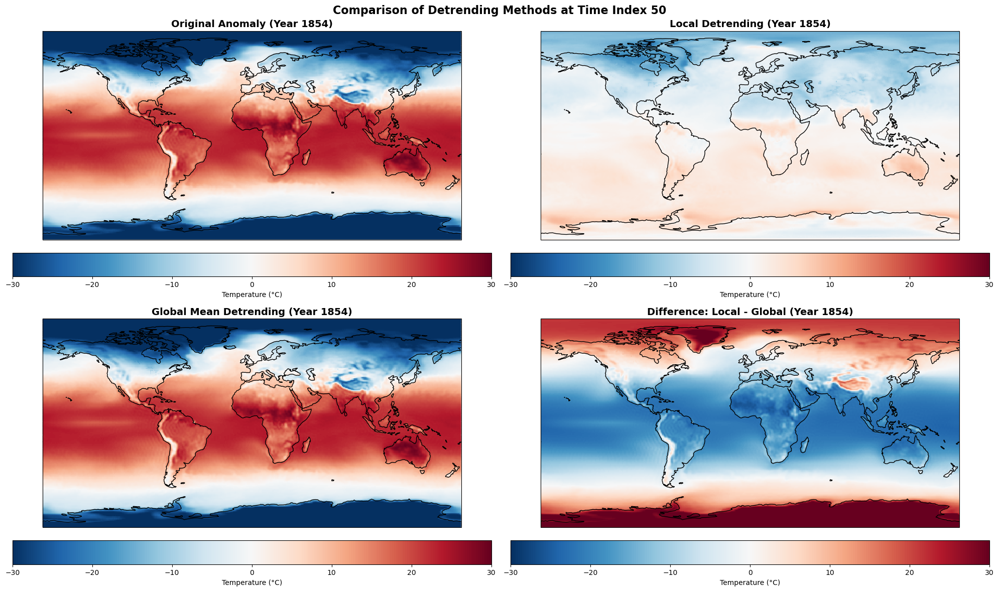

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Define time periods for detrending
time_periods = [
    (1850, 1980),
    (1981, 2000),
    (2001, 2014),
    (2015, 2100)
]

def detrend_gridpoint_by_period(data_3d, years, time_periods):
    """
    Detrend each grid point separately for each time period using vectorized linear regression.
    (Local detrending approach)
    """
    n_time, n_lat, n_lon = data_3d.shape
    detrended_data = np.zeros_like(data_3d)
    
    for start_year, end_year in time_periods:
        mask = (years >= start_year) & (years <= end_year)
        time_indices = np.where(mask)[0]
        
        if len(time_indices) == 0:
            continue
        
        period_data = data_3d[mask, :, :]
        n_time_period = period_data.shape[0]
        t = np.arange(n_time_period).astype(float)
        data_reshaped = period_data.reshape(n_time_period, -1)
        
        t_mean = np.mean(t)
        data_mean = np.mean(data_reshaped, axis=0)
        
        t_centered = t - t_mean
        data_centered = data_reshaped - data_mean
        
        numerator = np.sum(t_centered[:, np.newaxis] * data_centered, axis=0)
        denominator = np.sum(t_centered**2)
        
        b = numerator / denominator
        a = data_mean - b * t_mean
        
        trend = a[np.newaxis, :] + b[np.newaxis, :] * t[:, np.newaxis]
        residuals = data_reshaped - trend
        residuals_3d = residuals.reshape(n_time_period, n_lat, n_lon)
        
        detrended_data[mask, :, :] = residuals_3d
    
    return detrended_data

def detrend_by_global_mean_trend(data_3d, years, time_periods):
    """
    Detrend by fitting linear regression to global mean time series,
    then broadcasting this trend to all grid points.
    (Global mean detrending approach)
    """
    n_time, n_lat, n_lon = data_3d.shape
    detrended_data = np.zeros_like(data_3d)
    
    for start_year, end_year in time_periods:
        mask = (years >= start_year) & (years <= end_year)
        time_indices = np.where(mask)[0]
        
        if len(time_indices) == 0:
            continue
        
        period_data = data_3d[mask, :, :]
        n_time_period = period_data.shape[0]
        
        # Step 1: Calculate global mean time series
        global_mean_ts = np.mean(period_data, axis=(1, 2))
        
        # Step 2: Fit linear regression to global mean
        t = np.arange(n_time_period).astype(float)
        t_mean = np.mean(t)
        global_mean_mean = np.mean(global_mean_ts)
        
        t_centered = t - t_mean
        global_mean_centered = global_mean_ts - global_mean_mean
        
        # Calculate slope and intercept for global mean
        b_global = np.sum(t_centered * global_mean_centered) / np.sum(t_centered**2)
        a_global = global_mean_mean - b_global * t_mean
        
        # Step 3: Calculate the global mean trend
        global_trend = a_global + b_global * t
        
        # Step 4: Broadcast this trend to all grid points and subtract
        global_trend_broadcasted = global_trend[:, np.newaxis, np.newaxis]
        
        # Detrend by subtracting the global trend from all grid points
        detrended_period = period_data - global_trend_broadcasted
        
        detrended_data[mask, :, :] = detrended_period
    
    return detrended_data

# Calculate baseline for anomaly (1850-1900)
baseline_start = 1850
baseline_end = 1900

# Process temperature data
var = 'tas_hr'

# Use historical data
ds = ds_hist
tas_data = ds[var].values  # shape: (time, lat, lon)
years = ds.time.dt.year.values
lats = ds.lat.values
lons = ds.lon.values

# Calculate baseline from historical data
mask_baseline = (years >= baseline_start) & (years <= baseline_end)
baseline_data = tas_data[mask_baseline, :, :]
baseline = np.mean(baseline_data)

# Calculate anomalies
anomaly_data = tas_data - baseline

# Detrend using both methods
detrended_local = detrend_gridpoint_by_period(anomaly_data, years, time_periods)
detrended_global = detrend_by_global_mean_trend(anomaly_data, years, time_periods)

# Select time index 50
time_idx = 50
selected_year = years[time_idx]

# Extract 2D slices at this time step
original_slice = anomaly_data[time_idx, :, :]
local_detrend_slice = detrended_local[time_idx, :, :]
global_detrend_slice = detrended_global[time_idx, :, :]

# Calculate difference between the two detrending methods
difference_slice = local_detrend_slice - global_detrend_slice

# Create figure with 4 subplots (2x2)
fig = plt.figure(figsize=(20, 12))

# Define common color limits for better comparison
vmin_orig = -30
vmax_orig = 30
vmin_detrend = -30
vmax_detrend = 30
vmin_diff = -30
vmax_diff = 30

# Subplot 1: Original anomaly
ax1 = plt.subplot(2, 2, 1, projection=ccrs.PlateCarree())
ax1.coastlines()
im1 = ax1.pcolormesh(lons, lats, original_slice, cmap='RdBu_r', 
                      vmin=vmin_orig, vmax=vmax_orig, transform=ccrs.PlateCarree(),
                      shading='auto')
ax1.set_title(f'Original Anomaly (Year {selected_year})', fontsize=14, fontweight='bold')
ax1.set_xlabel('Longitude', fontsize=12)
ax1.set_ylabel('Latitude', fontsize=12)
plt.colorbar(im1, ax=ax1, orientation='horizontal', pad=0.05, label='Temperature (°C)')

# Subplot 2: Local detrending (each grid point)
ax2 = plt.subplot(2, 2, 2, projection=ccrs.PlateCarree())
ax2.coastlines()
im2 = ax2.pcolormesh(lons, lats, local_detrend_slice, cmap='RdBu_r', 
                      vmin=vmin_detrend, vmax=vmax_detrend, transform=ccrs.PlateCarree(),
                      shading='auto')
ax2.set_title(f'Local Detrending (Year {selected_year})', fontsize=14, fontweight='bold')
ax2.set_xlabel('Longitude', fontsize=12)
ax2.set_ylabel('Latitude', fontsize=12)
plt.colorbar(im2, ax=ax2, orientation='horizontal', pad=0.05, label='Temperature (°C)')

# Subplot 3: Global mean detrending
ax3 = plt.subplot(2, 2, 3, projection=ccrs.PlateCarree())
ax3.coastlines()
im3 = ax3.pcolormesh(lons, lats, global_detrend_slice, cmap='RdBu_r', 
                      vmin=vmin_detrend, vmax=vmax_detrend, transform=ccrs.PlateCarree(),
                      shading='auto')
ax3.set_title(f'Global Mean Detrending (Year {selected_year})', fontsize=14, fontweight='bold')
ax3.set_xlabel('Longitude', fontsize=12)
ax3.set_ylabel('Latitude', fontsize=12)
plt.colorbar(im3, ax=ax3, orientation='horizontal', pad=0.05, label='Temperature (°C)')

# Subplot 4: Difference (Local - Global)
ax4 = plt.subplot(2, 2, 4, projection=ccrs.PlateCarree())
ax4.coastlines()
im4 = ax4.pcolormesh(lons, lats, difference_slice, cmap='RdBu_r', 
                      vmin=vmin_diff, vmax=vmax_diff, transform=ccrs.PlateCarree(),
                      shading='auto')
ax4.set_title(f'Difference: Local - Global (Year {selected_year})', fontsize=14, fontweight='bold')
ax4.set_xlabel('Longitude', fontsize=12)
ax4.set_ylabel('Latitude', fontsize=12)
plt.colorbar(im4, ax=ax4, orientation='horizontal', pad=0.05, label='Temperature (°C)')

plt.suptitle(f'Comparison of Detrending Methods at Time Index {time_idx}', 
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()


In [34]:
original_slice

array([[-52.788185, -52.754982, -52.719826, ..., -52.80967 , -52.795998,
        -52.76084 ],
       [-52.3917  , -52.452248, -52.61631 , ..., -52.30381 , -52.313576,
        -52.32334 ],
       [-51.85264 , -52.10264 , -52.243263, ..., -51.206154, -51.337013,
        -51.504982],
       ...,
       [-35.973732, -35.99131 , -36.00303 , ..., -35.958107, -35.97959 ,
        -35.9542  ],
       [-35.856544, -35.879982, -35.858498, ..., -35.879982, -35.862404,
        -35.856544],
       [-35.65928 , -35.65928 , -35.663185, ..., -35.65342 , -35.645607,
        -35.655373]], dtype=float32)

Processing Train Hist
(1850-1980)...
Processing Test Hist
(1981-2014)...
Processing SSP126
(2015-2100)...
Processing SSP245
(2015-2100)...
Processing SSP585
(2015-2100)...

Correlation calculations complete!


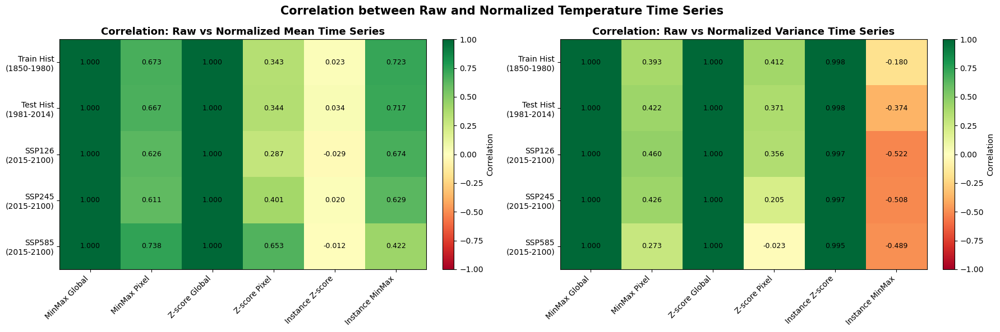


SUMMARY STATISTICS

Mean Time Series Correlations:
  Overall average: 0.6181
  Min: -0.0294, Max: 1.0000
  Best method (avg across scenarios): MinMax Global

Variance Time Series Correlations:
  Overall average: 0.5402
  Min: -0.5219, Max: 1.0000
  Best method (avg across scenarios): MinMax Global


In [11]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pickle
from scipy.stats import pearsonr

# ----------------------------
# Load data
# ----------------------------
data_dir = "data"
ds_hist = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_historical_r1i1p1f1_1850_2014_allvars_logpr.nc")
ds_ssp126 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp126_r1i1p1f1_2015_2100_allvars_logpr.nc")
ds_ssp245 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp245_r1i1p1f1_2015_2100_allvars_logpr.nc")
ds_ssp585 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp585_r1i1p1f1_2015_2100_allvars_logpr.nc")

# Load normalization statistics (computed from training period)
with open(f"{data_dir}/norm_stats.pkl", 'rb') as f:
    norm_stats = pickle.load(f)

# ----------------------------
# Normalization helpers
# ----------------------------
def apply_normalization(data, method, norm_stats, var_base):
    """Apply normalization method to data (time, lat, lon)."""
    if method == 'none':
        return data

    elif method == 'minmax_global':
        data_min = norm_stats[var_base]['lr_interp']['global_min']
        data_max = norm_stats[var_base]['lr_interp']['global_max']
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    elif method == 'minmax_pixel':
        data_min = norm_stats[var_base]['lr_interp']['pixel_min']
        data_max = norm_stats[var_base]['lr_interp']['pixel_max']
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    elif method == 'zscore_global':
        data_mean = norm_stats[var_base]['lr_interp']['global_mean']
        data_std  = norm_stats[var_base]['lr_interp']['global_std']
        return (data - data_mean) / (data_std + 1e-8)

    elif method == 'zscore_pixel':
        data_mean = norm_stats[var_base]['lr_interp']['pixel_mean']
        data_std  = norm_stats[var_base]['lr_interp']['pixel_std']
        return (data - data_mean) / (data_std + 1e-8)

    elif method == 'instance_zscore':
        # Per-sample zero-mean/unit-std (per time step)
        data_np = data.values  # shape: (time, lat, lon)
        
        # Calculate mean and std for each time step (over spatial dimensions)
        data_mean = np.mean(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        data_std = np.std(data_np, axis=(1, 2), keepdims=True)    # shape: (time, 1, 1)
        
        # Normalize
        data_normalized = (data_np - data_mean) / (data_std + 1e-8)
        
        # Convert back to xarray with same coordinates
        return xr.DataArray(data_normalized, coords=data.coords, dims=data.dims)

    elif method == 'instance_minmax':
        # Per-sample min-max to [-1, 1]
        data_np = data.values  # shape: (time, lat, lon)
        
        # Calculate min and max for each time step (over spatial dimensions)
        data_min = np.min(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        data_max = np.max(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        
        # Normalize
        data_normalized = 2 * (data_np - data_min) / (data_max - data_min + 1e-8) - 1
        
        # Convert back to xarray with same coordinates
        return xr.DataArray(data_normalized, coords=data.coords, dims=data.dims)

    else:
        raise ValueError(f"Unknown method: {method}")

# ----------------------------
# Calculate simple global mean (no weighting)
# ----------------------------
def calc_global_mean(data):
    """Calculate simple global mean (no area weighting)"""
    mean = data.mean(dim=['lat', 'lon'])
    return mean

# ----------------------------
# Calculate spatial variance
# ----------------------------
def calc_spatial_var(data):
    """Calculate spatial variance at each time point"""
    spatial_var = data.var(dim=['lat', 'lon'])
    return spatial_var

# ----------------------------
# Methods to compare
# ----------------------------
methods = ['minmax_global', 'minmax_pixel', 'zscore_global', 'zscore_pixel', 'instance_zscore', 'instance_minmax']
method_names = ['MinMax Global', 'MinMax Pixel', 'Z-score Global', 'Z-score Pixel', 'Instance Z-score', 'Instance MinMax']

# ----------------------------
# Variable to analyze
# ----------------------------
var_name = 'tas_lr_interp'
var_base = 'tas'

# ----------------------------
# Define scenarios/periods
# ----------------------------
scenarios = [
    ('Train Hist\n(1850-1980)', ds_hist, '1850', '1980'),
    ('Test Hist\n(1981-2014)', ds_hist, '1981', '2014'),
    ('SSP126\n(2015-2100)', ds_ssp126, '2015', '2100'),
    ('SSP245\n(2015-2100)', ds_ssp245, '2015', '2100'),
    ('SSP585\n(2015-2100)', ds_ssp585, '2015', '2100')
]

# ----------------------------
# Calculate correlations
# ----------------------------
# Initialize arrays to store correlations
# Shape: (n_scenarios, n_methods)
corr_mean = np.zeros((len(scenarios), len(methods)))
corr_var = np.zeros((len(scenarios), len(methods)))

for i, (scenario_name, ds, start_year, end_year) in enumerate(scenarios):
    print(f"Processing {scenario_name.strip()}...")
    
    # Get raw data for this period
    data_raw = ds[var_name].sel(time=slice(start_year, end_year))
    
    # Calculate raw time series
    raw_mean_ts = calc_global_mean(data_raw).values
    raw_var_ts = calc_spatial_var(data_raw).values
    
    for j, method in enumerate(methods):
        # Apply normalization
        data_norm = apply_normalization(data_raw, method, norm_stats, var_base)
        
        # Calculate normalized time series
        norm_mean_ts = calc_global_mean(data_norm).values
        norm_var_ts = calc_spatial_var(data_norm).values
        
        # Calculate correlations
        corr_mean[i, j] = pearsonr(raw_mean_ts, norm_mean_ts)[0]
        corr_var[i, j] = pearsonr(raw_var_ts, norm_var_ts)[0]

print("\nCorrelation calculations complete!")

# ----------------------------
# Create heatmaps
# ----------------------------
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Scenario labels (extract just the period name)
scenario_labels = [s[0] for s in scenarios]

# Heatmap 1: Mean correlations
im1 = axes[0].imshow(corr_mean, cmap='RdYlGn', aspect='auto', vmin=-1, vmax=1)
axes[0].set_xticks(range(len(methods)))
axes[0].set_xticklabels(method_names, rotation=45, ha='right')
axes[0].set_yticks(range(len(scenarios)))
axes[0].set_yticklabels(scenario_labels)
axes[0].set_title('Correlation: Raw vs Normalized Mean Time Series', fontsize=13, fontweight='bold')

# Add correlation values as text
for i in range(len(scenarios)):
    for j in range(len(methods)):
        text = axes[0].text(j, i, f'{corr_mean[i, j]:.3f}',
                           ha="center", va="center", color="black", fontsize=9)

cbar1 = plt.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)
cbar1.set_label('Correlation', fontsize=10)

# Heatmap 2: Variance correlations
im2 = axes[1].imshow(corr_var, cmap='RdYlGn', aspect='auto', vmin=-1, vmax=1)
axes[1].set_xticks(range(len(methods)))
axes[1].set_xticklabels(method_names, rotation=45, ha='right')
axes[1].set_yticks(range(len(scenarios)))
axes[1].set_yticklabels(scenario_labels)
axes[1].set_title('Correlation: Raw vs Normalized Variance Time Series', fontsize=13, fontweight='bold')

# Add correlation values as text
for i in range(len(scenarios)):
    for j in range(len(methods)):
        text = axes[1].text(j, i, f'{corr_var[i, j]:.3f}',
                           ha="center", va="center", color="black", fontsize=9)

cbar2 = plt.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)
cbar2.set_label('Correlation', fontsize=10)

plt.suptitle('Correlation between Raw and Normalized Temperature Time Series', 
             fontsize=15, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()


Processing Train Hist
(1850-1980)...
  Method: MinMax Global
  Method: MinMax Pixel
  Method: Z-score Global
  Method: Z-score Pixel
  Method: Instance Z-score
  Method: Instance MinMax
Processing Test Hist
(1981-2014)...
  Method: MinMax Global
  Method: MinMax Pixel
  Method: Z-score Global
  Method: Z-score Pixel
  Method: Instance Z-score
  Method: Instance MinMax
Processing SSP126
(2015-2100)...
  Method: MinMax Global
  Method: MinMax Pixel
  Method: Z-score Global
  Method: Z-score Pixel
  Method: Instance Z-score
  Method: Instance MinMax
Processing SSP245
(2015-2100)...
  Method: MinMax Global
  Method: MinMax Pixel
  Method: Z-score Global
  Method: Z-score Pixel
  Method: Instance Z-score
  Method: Instance MinMax
Processing SSP585
(2015-2100)...
  Method: MinMax Global
  Method: MinMax Pixel
  Method: Z-score Global
  Method: Z-score Pixel
  Method: Instance Z-score
  Method: Instance MinMax

Spatial pattern correlation calculations complete!


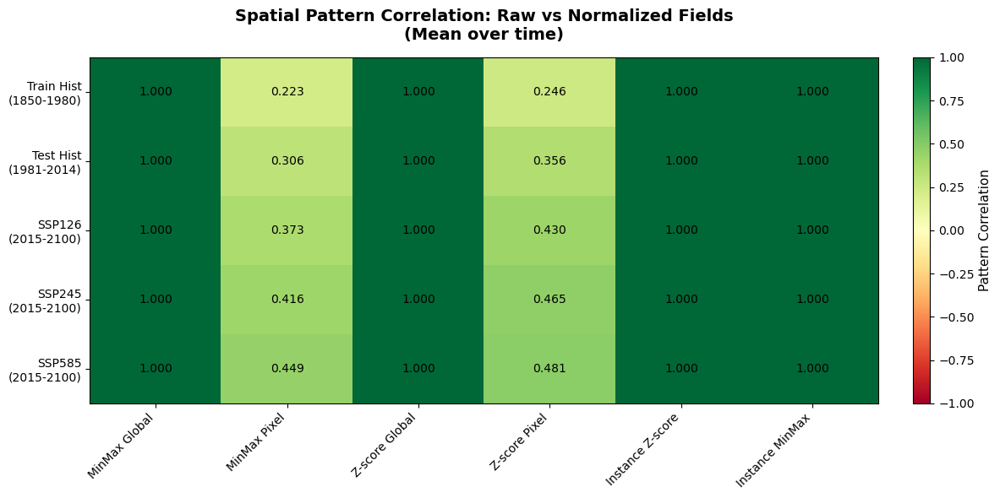

In [14]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pickle
from scipy.stats import pearsonr

# ----------------------------
# Load data
# ----------------------------
data_dir = "data"
ds_hist = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_historical_r1i1p1f1_1850_2014_allvars_logpr.nc")
ds_ssp126 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp126_r1i1p1f1_2015_2100_allvars_logpr.nc")
ds_ssp245 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp245_r1i1p1f1_2015_2100_allvars_logpr.nc")
ds_ssp585 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp585_r1i1p1f1_2015_2100_allvars_logpr.nc")

# Load normalization statistics (computed from training period)
with open(f"{data_dir}/norm_stats.pkl", 'rb') as f:
    norm_stats = pickle.load(f)

# ----------------------------
# Normalization helpers
# ----------------------------
def apply_normalization(data, method, norm_stats, var_base):
    """Apply normalization method to data (time, lat, lon)."""
    if method == 'none':
        return data

    elif method == 'minmax_global':
        data_min = norm_stats[var_base]['lr_interp']['global_min']
        data_max = norm_stats[var_base]['lr_interp']['global_max']
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    elif method == 'minmax_pixel':
        data_min = norm_stats[var_base]['lr_interp']['pixel_min']
        data_max = norm_stats[var_base]['lr_interp']['pixel_max']
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    elif method == 'zscore_global':
        data_mean = norm_stats[var_base]['lr_interp']['global_mean']
        data_std  = norm_stats[var_base]['lr_interp']['global_std']
        return (data - data_mean) / (data_std + 1e-8)

    elif method == 'zscore_pixel':
        data_mean = norm_stats[var_base]['lr_interp']['pixel_mean']
        data_std  = norm_stats[var_base]['lr_interp']['pixel_std']
        return (data - data_mean) / (data_std + 1e-8)

    elif method == 'instance_zscore':
        # Per-sample zero-mean/unit-std (per time step)
        data_np = data.values  # shape: (time, lat, lon)
        
        # Calculate mean and std for each time step (over spatial dimensions)
        data_mean = np.mean(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        data_std = np.std(data_np, axis=(1, 2), keepdims=True)    # shape: (time, 1, 1)
        
        # Normalize
        data_normalized = (data_np - data_mean) / (data_std + 1e-8)
        
        # Convert back to xarray with same coordinates
        return xr.DataArray(data_normalized, coords=data.coords, dims=data.dims)

    elif method == 'instance_minmax':
        # Per-sample min-max to [-1, 1]
        data_np = data.values  # shape: (time, lat, lon)
        
        # Calculate min and max for each time step (over spatial dimensions)
        data_min = np.min(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        data_max = np.max(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        
        # Normalize
        data_normalized = 2 * (data_np - data_min) / (data_max - data_min + 1e-8) - 1
        
        # Convert back to xarray with same coordinates
        return xr.DataArray(data_normalized, coords=data.coords, dims=data.dims)

    else:
        raise ValueError(f"Unknown method: {method}")

# ----------------------------
# Calculate spatial pattern correlation
# ----------------------------
def calc_spatial_pattern_correlation(raw_data, norm_data):
    """
    Calculate spatial pattern correlation at each time step,
    then return the mean correlation over time.
    
    Args:
        raw_data: xarray DataArray with dims (time, lat, lon)
        norm_data: xarray DataArray with dims (time, lat, lon)
    
    Returns:
        mean_pattern_corr: scalar, average pattern correlation over time
    """
    n_times = raw_data.shape[0]
    pattern_corrs = np.zeros(n_times)
    
    for t in range(n_times):
        # Get 2D fields at time t
        raw_field = raw_data.isel(time=t).values  # (lat, lon)
        norm_field = norm_data.isel(time=t).values  # (lat, lon)
        
        # Flatten to 1D vectors
        raw_flat = raw_field.flatten()
        norm_flat = norm_field.flatten()
        
        # Remove any NaN values (if present)
        mask = ~(np.isnan(raw_flat) | np.isnan(norm_flat))
        raw_flat = raw_flat[mask]
        norm_flat = norm_flat[mask]
        
        # Calculate Pearson correlation
        if len(raw_flat) > 1:
            pattern_corrs[t] = pearsonr(raw_flat, norm_flat)[0]
        else:
            pattern_corrs[t] = np.nan
    
    # Return mean pattern correlation over time
    return np.nanmean(pattern_corrs)

# ----------------------------
# Methods to compare
# ----------------------------
methods = ['minmax_global', 'minmax_pixel', 'zscore_global', 'zscore_pixel', 'instance_zscore', 'instance_minmax']
method_names = ['MinMax Global', 'MinMax Pixel', 'Z-score Global', 'Z-score Pixel', 'Instance Z-score', 'Instance MinMax']

# ----------------------------
# Variable to analyze
# ----------------------------
var_name = 'tas_lr_interp'
var_base = 'tas'

# ----------------------------
# Define scenarios/periods
# ----------------------------
scenarios = [
    ('Train Hist\n(1850-1980)', ds_hist, '1850', '1980'),
    ('Test Hist\n(1981-2014)', ds_hist, '1981', '2014'),
    ('SSP126\n(2015-2100)', ds_ssp126, '2015', '2100'),
    ('SSP245\n(2015-2100)', ds_ssp245, '2015', '2100'),
    ('SSP585\n(2015-2100)', ds_ssp585, '2015', '2100')
]

# ----------------------------
# Calculate spatial pattern correlations
# ----------------------------
# Initialize array to store pattern correlations
# Shape: (n_scenarios, n_methods)
pattern_corr = np.zeros((len(scenarios), len(methods)))

for i, (scenario_name, ds, start_year, end_year) in enumerate(scenarios):
    print(f"Processing {scenario_name.strip()}...")
    
    # Get raw data for this period
    data_raw = ds[var_name].sel(time=slice(start_year, end_year))
    
    for j, method in enumerate(methods):
        print(f"  Method: {method_names[j]}")
        
        # Apply normalization
        data_norm = apply_normalization(data_raw, method, norm_stats, var_base)
        
        # Calculate mean spatial pattern correlation
        pattern_corr[i, j] = calc_spatial_pattern_correlation(data_raw, data_norm)

print("\nSpatial pattern correlation calculations complete!")

# ----------------------------
# Create heatmap
# ----------------------------
fig, ax = plt.subplots(1, 1, figsize=(12, 6))

# Scenario labels
scenario_labels = [s[0] for s in scenarios]

# Heatmap: Spatial pattern correlation
im = ax.imshow(pattern_corr, cmap='RdYlGn', aspect='auto', vmin=-1, vmax=1)
ax.set_xticks(range(len(methods)))
ax.set_xticklabels(method_names, rotation=45, ha='right')
ax.set_yticks(range(len(scenarios)))
ax.set_yticklabels(scenario_labels)
ax.set_title('Spatial Pattern Correlation: Raw vs Normalized Fields\n(Mean over time)', 
             fontsize=14, fontweight='bold', pad=15)

# Add correlation values as text
for i in range(len(scenarios)):
    for j in range(len(methods)):
        text = ax.text(j, i, f'{pattern_corr[i, j]:.3f}',
                       ha="center", va="center", color="black", fontsize=10)

cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Pattern Correlation', fontsize=11)

plt.tight_layout()
plt.show()


Calculating distribution shift metrics...

Processing method: No Norm
  vs Test Hist
(1981-2014)
  vs SSP126
(2015-2100)
  vs SSP245
(2015-2100)
  vs SSP585
(2015-2100)

Processing method: MinMax Global
  vs Test Hist
(1981-2014)
  vs SSP126
(2015-2100)
  vs SSP245
(2015-2100)
  vs SSP585
(2015-2100)

Processing method: MinMax Pixel
  vs Test Hist
(1981-2014)
  vs SSP126
(2015-2100)
  vs SSP245
(2015-2100)
  vs SSP585
(2015-2100)

Processing method: Z-score Global
  vs Test Hist
(1981-2014)
  vs SSP126
(2015-2100)
  vs SSP245
(2015-2100)
  vs SSP585
(2015-2100)

Processing method: Z-score Pixel
  vs Test Hist
(1981-2014)
  vs SSP126
(2015-2100)
  vs SSP245
(2015-2100)
  vs SSP585
(2015-2100)

Processing method: Instance Z-score
  vs Test Hist
(1981-2014)
  vs SSP126
(2015-2100)
  vs SSP245
(2015-2100)
  vs SSP585
(2015-2100)

Processing method: Instance MinMax
  vs Test Hist
(1981-2014)
  vs SSP126
(2015-2100)
  vs SSP245
(2015-2100)
  vs SSP585
(2015-2100)

Distribution shift calculat

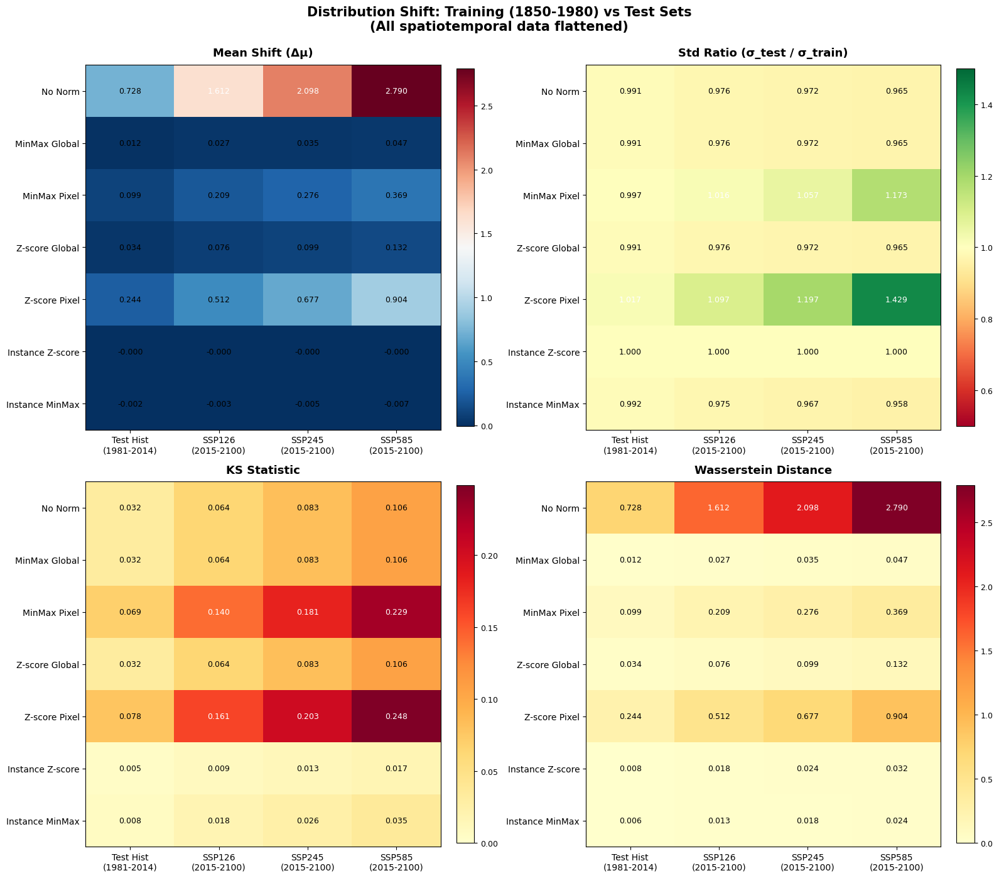

In [15]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pickle
from scipy.stats import ks_2samp
from scipy.spatial.distance import jensenshannon
from scipy.stats import wasserstein_distance

# ----------------------------
# Load data
# ----------------------------
data_dir = "data"
ds_hist = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_historical_r1i1p1f1_1850_2014_allvars_logpr.nc")
ds_ssp126 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp126_r1i1p1f1_2015_2100_allvars_logpr.nc")
ds_ssp245 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp245_r1i1p1f1_2015_2100_allvars_logpr.nc")
ds_ssp585 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp585_r1i1p1f1_2015_2100_allvars_logpr.nc")

# Load normalization statistics (computed from training period)
with open(f"{data_dir}/norm_stats.pkl", 'rb') as f:
    norm_stats = pickle.load(f)

# ----------------------------
# Normalization helpers
# ----------------------------
def apply_normalization(data, method, norm_stats, var_base):
    """Apply normalization method to data (time, lat, lon)."""
    if method == 'none':
        return data

    elif method == 'minmax_global':
        data_min = norm_stats[var_base]['lr_interp']['global_min']
        data_max = norm_stats[var_base]['lr_interp']['global_max']
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    elif method == 'minmax_pixel':
        data_min = norm_stats[var_base]['lr_interp']['pixel_min']
        data_max = norm_stats[var_base]['lr_interp']['pixel_max']
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    elif method == 'zscore_global':
        data_mean = norm_stats[var_base]['lr_interp']['global_mean']
        data_std  = norm_stats[var_base]['lr_interp']['global_std']
        return (data - data_mean) / (data_std + 1e-8)

    elif method == 'zscore_pixel':
        data_mean = norm_stats[var_base]['lr_interp']['pixel_mean']
        data_std  = norm_stats[var_base]['lr_interp']['pixel_std']
        return (data - data_mean) / (data_std + 1e-8)

    elif method == 'instance_zscore':
        # Per-sample zero-mean/unit-std (per time step)
        data_np = data.values  # shape: (time, lat, lon)
        
        # Calculate mean and std for each time step (over spatial dimensions)
        data_mean = np.mean(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        data_std = np.std(data_np, axis=(1, 2), keepdims=True)    # shape: (time, 1, 1)
        
        # Normalize
        data_normalized = (data_np - data_mean) / (data_std + 1e-8)
        
        # Convert back to xarray with same coordinates
        return xr.DataArray(data_normalized, coords=data.coords, dims=data.dims)

    elif method == 'instance_minmax':
        # Per-sample min-max to [-1, 1]
        data_np = data.values  # shape: (time, lat, lon)
        
        # Calculate min and max for each time step (over spatial dimensions)
        data_min = np.min(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        data_max = np.max(data_np, axis=(1, 2), keepdims=True)  # shape: (time, 1, 1)
        
        # Normalize
        data_normalized = 2 * (data_np - data_min) / (data_max - data_min + 1e-8) - 1
        
        # Convert back to xarray with same coordinates
        return xr.DataArray(data_normalized, coords=data.coords, dims=data.dims)

    else:
        raise ValueError(f"Unknown method: {method}")

# ----------------------------
# Flatten data to 1D distribution
# ----------------------------
def flatten_data(data):
    """Flatten (time, lat, lon) to 1D array, removing NaNs"""
    flat = data.values.flatten()
    return flat[~np.isnan(flat)]

# ----------------------------
# Calculate distribution shift metrics
# ----------------------------
def calc_distribution_shift(train_flat, test_flat):
    """
    Calculate 4 distribution shift metrics between train and test distributions.
    
    Returns:
        delta_mean: Mean shift (test - train)
        ratio_std: Std ratio (test / train)
        ks_stat: Kolmogorov-Smirnov statistic
        wasserstein: 1-Wasserstein distance
    """
    # 1. Mean shift
    delta_mean = np.mean(test_flat) - np.mean(train_flat)
    
    # 2. Std ratio
    ratio_std = np.std(test_flat) / (np.std(train_flat) + 1e-8)
    
    # 3. KS statistic
    ks_stat = ks_2samp(train_flat, test_flat)[0]
    
    # 4. Wasserstein distance (1-Wasserstein / Earth Mover's distance)
    wasserstein = wasserstein_distance(train_flat, test_flat)
    
    return delta_mean, ratio_std, ks_stat, wasserstein

# ----------------------------
# Methods to compare (including 'none')
# ----------------------------
methods = ['none', 'minmax_global', 'minmax_pixel', 'zscore_global', 'zscore_pixel', 'instance_zscore', 'instance_minmax']
method_names = ['No Norm', 'MinMax Global', 'MinMax Pixel', 'Z-score Global', 'Z-score Pixel', 'Instance Z-score', 'Instance MinMax']

# ----------------------------
# Variable to analyze
# ----------------------------
var_name = 'tas_lr_interp'
var_base = 'tas'

# ----------------------------
# Define test scenarios
# ----------------------------
test_scenarios = [
    ('Test Hist\n(1981-2014)', ds_hist, '1981', '2014'),
    ('SSP126\n(2015-2100)', ds_ssp126, '2015', '2100'),
    ('SSP245\n(2015-2100)', ds_ssp245, '2015', '2100'),
    ('SSP585\n(2015-2100)', ds_ssp585, '2015', '2100')
]

# ----------------------------
# Calculate distribution shifts
# ----------------------------
# Initialize arrays to store metrics
# Shape: (n_methods, n_test_scenarios)
delta_means = np.zeros((len(methods), len(test_scenarios)))
ratio_stds = np.zeros((len(methods), len(test_scenarios)))
ks_stats = np.zeros((len(methods), len(test_scenarios)))
wassersteins = np.zeros((len(methods), len(test_scenarios)))

print("Calculating distribution shift metrics...")

for i, method in enumerate(methods):
    print(f"\nProcessing method: {method_names[i]}")
    
    # Get training data and apply normalization
    train_data = ds_hist[var_name].sel(time=slice('1850', '1980'))
    if method == 'none':
        train_norm = train_data
    else:
        train_norm = apply_normalization(train_data, method, norm_stats, var_base)
    
    # Flatten training data
    train_flat = flatten_data(train_norm)
    
    for j, (scenario_name, ds, start_year, end_year) in enumerate(test_scenarios):
        print(f"  vs {scenario_name.strip()}")
        
        # Get test data and apply normalization
        test_data = ds[var_name].sel(time=slice(start_year, end_year))
        if method == 'none':
            test_norm = test_data
        else:
            test_norm = apply_normalization(test_data, method, norm_stats, var_base)
        
        # Flatten test data
        test_flat = flatten_data(test_norm)
        
        # Calculate distribution shift metrics
        delta_mean, ratio_std, ks_stat, wasserstein = calc_distribution_shift(train_flat, test_flat)
        
        delta_means[i, j] = delta_mean
        ratio_stds[i, j] = ratio_std
        ks_stats[i, j] = ks_stat
        wassersteins[i, j] = wasserstein

print("\nDistribution shift calculations complete!")

# ----------------------------
# Create heatmaps
# ----------------------------
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# Test scenario labels
test_labels = [s[0] for s in test_scenarios]

# Flatten axes for easier iteration
axes_flat = axes.flatten()

# Metrics and their properties
metrics = [
    (delta_means, 'Mean Shift (Δμ)', 'RdBu_r', None, None),
    (ratio_stds, 'Std Ratio (σ_test / σ_train)', 'RdYlGn', 0.5, 1.5),
    (ks_stats, 'KS Statistic', 'YlOrRd', 0, None),
    (wassersteins, 'Wasserstein Distance', 'YlOrRd', 0, None)
]

for idx, (metric_data, title, cmap, vmin, vmax) in enumerate(metrics):
    ax = axes_flat[idx]
    
    # Determine color scale
    if vmin is None:
        vmin = metric_data.min()
    if vmax is None:
        vmax = metric_data.max()
    
    # Create heatmap
    im = ax.imshow(metric_data, cmap=cmap, aspect='auto', vmin=vmin, vmax=vmax)
    
    ax.set_xticks(range(len(test_scenarios)))
    ax.set_xticklabels(test_labels, rotation=0, ha='center')
    ax.set_yticks(range(len(methods)))
    ax.set_yticklabels(method_names)
    ax.set_title(title, fontsize=13, fontweight='bold', pad=10)
    
    # Add values as text
    for i in range(len(methods)):
        for j in range(len(test_scenarios)):
            value = metric_data[i, j]
            # Choose text color based on background
            text_color = 'white' if (value - vmin) / (vmax - vmin + 1e-8) > 0.5 else 'black'
            text = ax.text(j, i, f'{value:.3f}',
                          ha="center", va="center", color=text_color, fontsize=9)
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=9)

plt.suptitle('Distribution Shift: Training (1850-1980) vs Test Sets\n(All spatiotemporal data flattened)', 
             fontsize=15, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()


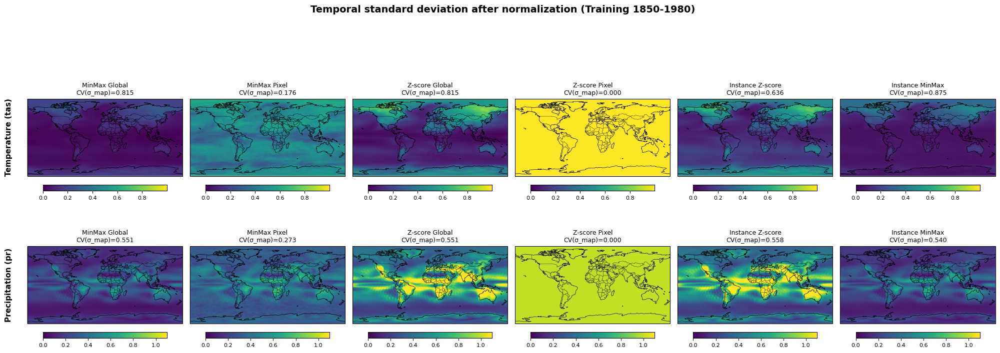

In [4]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pickle

# ----------------------------
# Load data
# ----------------------------
data_dir = "data"
ds_hist = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_historical_r1i1p1f1_1850_2014_allvars_logpr.nc")

# Load normalization statistics
with open(f"{data_dir}/norm_stats.pkl", 'rb') as f:
    norm_stats = pickle.load(f)

# ----------------------------
# Training period
# ----------------------------
train_start = '1850'
train_end   = '1980'

# ----------------------------
# Normalization helpers
# ----------------------------
def apply_normalization(data, method, norm_stats, var_base):
    """Apply normalization method to data (time, lat, lon)."""
    if method == 'none':
        return data

    elif method == 'minmax_global':
        data_min = norm_stats[var_base]['lr_interp']['global_min']
        data_max = norm_stats[var_base]['lr_interp']['global_max']
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    elif method == 'minmax_pixel':
        data_min = norm_stats[var_base]['lr_interp']['pixel_min']
        data_max = norm_stats[var_base]['lr_interp']['pixel_max']
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    elif method == 'zscore_global':
        data_mean = norm_stats[var_base]['lr_interp']['global_mean']
        data_std  = norm_stats[var_base]['lr_interp']['global_std']
        return (data - data_mean) / (data_std + 1e-8)

    elif method == 'zscore_pixel':
        data_mean = norm_stats[var_base]['lr_interp']['pixel_mean']
        data_std  = norm_stats[var_base]['lr_interp']['pixel_std']
        return (data - data_mean) / (data_std + 1e-8)

    elif method == 'instance_zscore':
        # Per-sample zero-mean/unit-std (per time step)
        return (data - data.mean(dim=['lat', 'lon'])) / (data.std(dim=['lat', 'lon']) + 1e-8)

    elif method == 'instance_minmax':
        # Per-sample min-max to [-1, 1]
        data_min = data.min(dim=['lat', 'lon'])
        data_max = data.max(dim=['lat', 'lon'])
        return 2 * (data - data_min) / (data_max - data_min + 1e-8) - 1

    else:
        raise ValueError(f"Unknown method: {method}")

# Methods to compare
methods = ['minmax_global', 'minmax_pixel', 'zscore_global', 'zscore_pixel', 'instance_zscore', 'instance_minmax']
method_names = ['MinMax Global', 'MinMax Pixel', 'Z-score Global', 'Z-score Pixel', 'Instance Z-score', 'Instance MinMax']

# ----------------------------
# Variables to plot (rows)
# ----------------------------
variables = [
    ('tas_lr_interp', 'tas', 'Temperature (tas)'),
    ('pr_lr_interp',  'pr',  'Precipitation (pr)')  # if your file stores log1p(pr), label accordingly
]

# ----------------------------
# Precompute std maps & CVs per row, then plot
# ----------------------------
# Storage: for each row, a list of dicts with std_map, cv, lons, lats
rows_data = []

for (var_name, var_base, var_label) in variables:
    data_raw = ds_hist[var_name].sel(time=slice(train_start, train_end))

    method_outputs = []
    # First pass: compute std maps and spatial CVs; also collect for a shared vmax per row
    all_std_values = []

    for method in methods:
        data_norm = apply_normalization(data_raw, method, norm_stats, var_base)
        std_map = data_norm.std(dim='time').values  # (lat, lon)

        # Spatial CV of the std map
        mu_std_over_space = np.nanmean(std_map)
        sg_std_over_space = np.nanstd(std_map)
        cv_spatial_stdmap = float(sg_std_over_space / (mu_std_over_space + 1e-12))

        # Save
        method_outputs.append({
            'std_map': std_map,
            'cv': cv_spatial_stdmap,
            'lons': data_norm.lon.values,
            'lats': data_norm.lat.values
        })

        # For robust vmax across columns of this row
        flat_std = std_map[np.isfinite(std_map)]
        if flat_std.size > 0:
            all_std_values.append(flat_std)

    # Shared vmax per row (98th percentile across all methods for this variable)
    if len(all_std_values) > 0:
        concat_vals = np.concatenate(all_std_values)
        row_vmax = float(np.nanpercentile(concat_vals, 98))
    else:
        row_vmax = 1.0

    rows_data.append((var_label, method_outputs, row_vmax))

# ----------------------------
# Plotting: 2 rows x 6 columns (std maps only)
# ----------------------------
fig = plt.figure(figsize=(20, 7))

for row_idx, (var_label, method_outputs, row_vmax) in enumerate(rows_data):
    for col, (method, method_name) in enumerate(zip(methods, method_names)):
        item = method_outputs[col]
        std_map = item['std_map']
        cv_val  = item['cv']
        lons    = item['lons']
        lats    = item['lats']

        ax = plt.subplot(2, 6, row_idx * 6 + col + 1, projection=ccrs.PlateCarree())
        im = ax.pcolormesh(
            lons, lats, std_map,
            transform=ccrs.PlateCarree(),
            cmap='viridis',
            vmin=0,
            vmax=row_vmax
        )
        ax.coastlines(linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.3)
        ax.set_title(f'{method_name}\nCV(σ_map)={cv_val:.3f}', fontsize=9)

        if col == 0:
            ax.text(-0.12, 0.5, var_label,
                    transform=ax.transAxes, rotation=90,
                    fontsize=11, fontweight='bold',
                    va='center', ha='center')

        cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
        cbar.ax.tick_params(labelsize=8)

plt.suptitle(
    f'Temporal standard deviation after normalization (Training {train_start}-{train_end})',
    fontsize=14, fontweight='bold', y=1.03
)
plt.tight_layout()
plt.show()


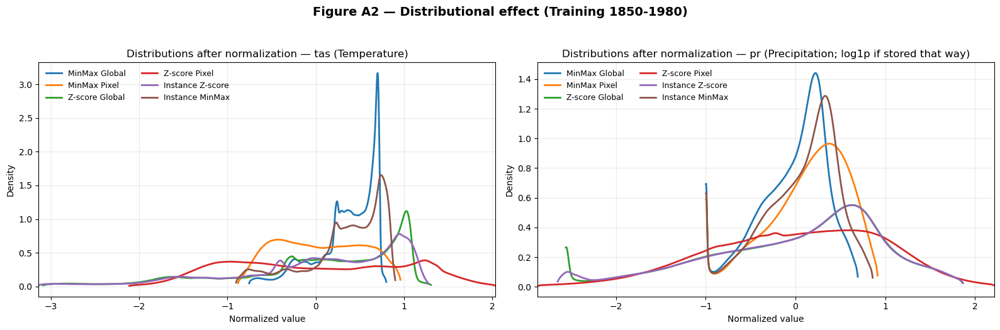

In [6]:
# ============================
# Figure A2: Distributional effect (KDE-like density plots)
# Panels: (a) tas, (b) pr (log1p if stored that way)
# Methods: all 6 (Global/Pixel z & minmax, Instance z & minmax)
# ============================

import numpy as np
import matplotlib.pyplot as plt

# ---------- KDE via histogram + Gaussian smoothing (no seaborn/scipy) ----------
def kde_from_values(values, nbins=512):
    """
    Build a smooth density from 1D values using:
      (1) density histogram, (2) Gaussian smoothing (Silverman's bandwidth).
    Returns x_centers, density_smoothed.
    """
    values = values[np.isfinite(values)]
    if values.size == 0:
        x = np.linspace(-1, 1, nbins)
        return x, np.zeros_like(x)

    # Robust range (ignore extreme outliers)
    vmin = np.percentile(values, 0.5)
    vmax = np.percentile(values, 99.5)
    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmin == vmax:
        vmin, vmax = values.min(), values.max()
        if vmin == vmax:  # all equal
            vmin, vmax = vmin - 1.0, vmax + 1.0

    edges = np.linspace(vmin, vmax, nbins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    hist, _ = np.histogram(values, bins=edges, density=True)

    std = np.std(values)
    n = len(values)
    if std == 0 or n < 2:
        return centers, hist

    # Silverman's bandwidth
    h = 1.06 * std * (n ** (-1/5))
    dx = centers[1] - centers[0]
    sigma_bins = max(h / dx, 1e-6)

    # Finite Gaussian kernel (±3σ)
    half_width = int(np.ceil(3.0 * sigma_bins))
    kx = np.arange(-half_width, half_width + 1)
    kernel = np.exp(-0.5 * (kx / sigma_bins) ** 2)
    kernel /= kernel.sum()

    smooth = np.convolve(hist, kernel, mode='same')
    return centers, smooth

# ---------- Variables and training window ----------
fig_vars = [
    ('tas_lr_interp', 'tas', 'tas (Temperature)'),
    ('pr_lr_interp',  'pr',  'pr (Precipitation; log1p if stored that way)')
]
train_slice = dict(time=slice(train_start, train_end))

# ---------- Plot all six methods ----------
fig, axes = plt.subplots(1, 2, figsize=(16, 5), squeeze=False)
axes = axes[0]

for ax, (var_name, var_base, var_title) in zip(axes, fig_vars):

    data_raw = ds_hist[var_name].sel(**train_slice)

    # Build curves for all methods
    curves = []
    for method, label in zip(methods, method_names):
        data_norm = apply_normalization(data_raw, method, norm_stats, var_base)
        vals = data_norm.values.ravel()
        x, y = kde_from_values(vals, nbins=512)
        curves.append((label, x, y))

    # Shared x-limits per panel
    xmin = min(c[1].min() for c in curves)
    xmax = max(c[1].max() for c in curves)

    # Plot all six lines
    for label, x, y in curves:
        ax.plot(x, y, linewidth=2, label=label)

    ax.set_xlim(xmin, xmax)
    ax.set_xlabel('Normalized value')
    ax.set_ylabel('Density')
    ax.set_title(f'Distributions after normalization — {var_title}')
    ax.grid(True, alpha=0.25)
    ax.legend(frameon=False, fontsize=9, ncol=2)

plt.suptitle(f'Figure A2 — Distributional effect (Training {train_start}-{train_end})',
             fontsize=14, fontweight='bold', y=1.04)
plt.tight_layout()
plt.show()


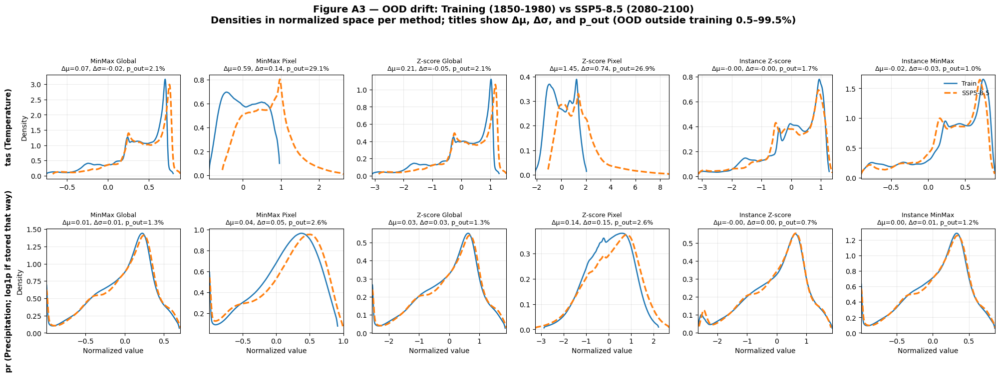

In [7]:
# ============================
# Figure A3 — OOD drift (SSP5-8.5) for all 6 normalizations on tas & pr
# Overlays training vs OOD KDE-like densities
# Reports Δμ, Δσ and fraction of OOD values outside training 0.5–99.5% range
# ============================

import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Load SSP5-8.5
ds_ssp585 = xr.open_dataset(f"{data_dir}/MPI-ESM1-2-HR-LR_ssp585_r1i1p1f1_2015_2100_allvars_logpr.nc")

# Use the same training window as before
train_slice = dict(time=slice(train_start, train_end))

# OOD window: pick a representative future slice (adjust as you like)
ood_slice = dict(time=slice('2080', '2100'))

# ---------- KDE via histogram + Gaussian smoothing ----------
def kde_from_values(values, nbins=512):
    values = values[np.isfinite(values)]
    if values.size == 0:
        x = np.linspace(-1, 1, nbins)
        return x, np.zeros_like(x)

    # Robust range
    vmin = np.percentile(values, 0.5)
    vmax = np.percentile(values, 99.5)
    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmin == vmax:
        vmin, vmax = values.min(), values.max()
        if vmin == vmax:
            vmin, vmax = vmin - 1.0, vmax + 1.0

    edges = np.linspace(vmin, vmax, nbins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    hist, _ = np.histogram(values, bins=edges, density=True)

    std = np.std(values)
    n = len(values)
    if std == 0 or n < 2:
        return centers, hist

    # Silverman's bandwidth
    h = 1.06 * std * (n ** (-1/5))
    dx = centers[1] - centers[0]
    sigma_bins = max(h / dx, 1e-6)

    hw = int(np.ceil(3.0 * sigma_bins))
    kx = np.arange(-hw, hw + 1)
    kernel = np.exp(-0.5 * (kx / sigma_bins) ** 2)
    kernel /= kernel.sum()

    smooth = np.convolve(hist, kernel, mode='same')
    return centers, smooth

# ---------- Variables (rows) ----------
fig_vars = [
    ('tas_lr_interp', 'tas', 'tas (Temperature)'),
    ('pr_lr_interp',  'pr',  'pr (Precipitation; log1p if stored that way)')
]

# ---------- Helper to flatten ----------
def flat_vals(da):
    v = da.values.ravel()
    return v[np.isfinite(v)]

# ---------- Build plots: 2 rows × 6 columns ----------
fig = plt.figure(figsize=(20, 7))

for row_idx, (var_name, var_base, var_label) in enumerate(fig_vars):

    # Select data for train and OOD
    train_raw = ds_hist[var_name].sel(**train_slice)
    ood_raw   = ds_ssp585[var_name].sel(**ood_slice)

    for col, (method, method_name) in enumerate(zip(methods, method_names)):

        # Normalize using the same method (instance norms are per-sample)
        train_norm = apply_normalization(train_raw, method, norm_stats, var_base)
        ood_norm   = apply_normalization(ood_raw,   method, norm_stats, var_base)

        # Flatten
        v_train = flat_vals(train_norm)
        v_ood   = flat_vals(ood_norm)

        # KDE curves
        x_tr, y_tr = kde_from_values(v_train, nbins=512)
        x_od, y_od = kde_from_values(v_ood,   nbins=512)

        # Summary stats in normalized space
        mu_tr, sg_tr = float(np.nanmean(v_train)), float(np.nanstd(v_train))
        mu_od, sg_od = float(np.nanmean(v_ood)),   float(np.nanstd(v_ood))
        d_mu = mu_od - mu_tr
        d_sg = sg_od - sg_tr

        # Fraction of OOD values outside training central band (0.5–99.5th percentiles)
        lo = np.nanpercentile(v_train, 0.5)
        hi = np.nanpercentile(v_train, 99.5)
        p_out = float(np.mean((v_ood < lo) | (v_ood > hi))) if v_ood.size > 0 else 0.0

        # Panel
        ax = plt.subplot(2, 6, row_idx * 6 + col + 1)
        # Shared x-limits: combine supports
        xmin = min(x_tr.min(), x_od.min())
        xmax = max(x_tr.max(), x_od.max())

        ax.plot(x_tr, y_tr, label='Train', linewidth=1.8)
        ax.plot(x_od, y_od, label='SSP5-8.5', linewidth=2.4, linestyle='--')

        ax.set_xlim(xmin, xmax)
        ax.grid(True, alpha=0.25)
        if row_idx == 1:
            ax.set_xlabel('Normalized value')
        if col == 0:
            ax.set_ylabel('Density')

        ax.set_title(
            f'{method_name}\nΔμ={d_mu:.2f}, Δσ={d_sg:.2f}, p_out={p_out*100:.1f}%',
            fontsize=9
        )

        if row_idx == 0 and col == 5:
            ax.legend(frameon=False, fontsize=9, loc='upper right')

        # Row label on left margin
        if col == 0:
            ax.text(-0.28, 0.5, var_label, rotation=90, va='center', ha='center',
                    transform=ax.transAxes, fontsize=11, fontweight='bold')

plt.suptitle(
    f'Figure A3 — OOD drift: Training ({train_start}-{train_end}) vs SSP5-8.5 (2080–2100)\n'
    'Densities in normalized space per method; titles show Δμ, Δσ, and p_out (OOD outside training 0.5–99.5%)',
    fontsize=14, fontweight='bold', y=1.05
)
plt.tight_layout()
plt.show()


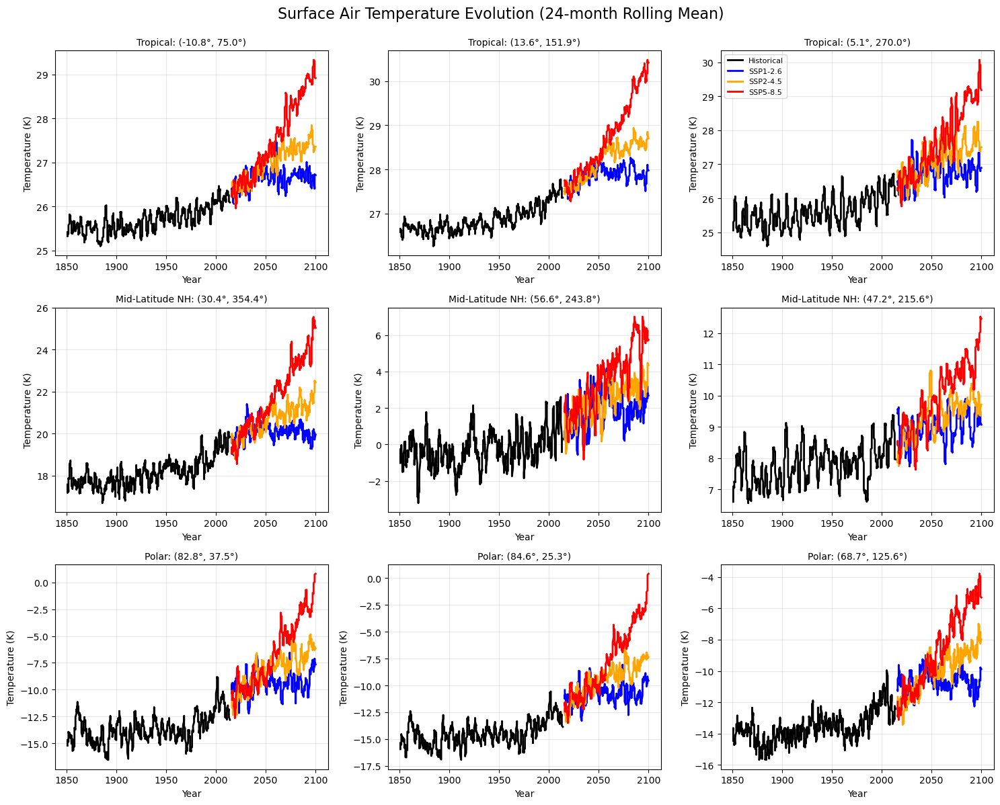

In [5]:
import matplotlib.pyplot as plt
import numpy as np

# Set random seed for reproducibility
np.random.seed(42)

# Define regions based on latitude
tropical_lats = ds_hist.lat[(ds_hist.lat >= -23.5) & (ds_hist.lat <= 23.5)]
midlat_lats = ds_hist.lat[(ds_hist.lat >= 30) & (ds_hist.lat <= 60)]
polar_lats = ds_hist.lat[ds_hist.lat >= 66.5]

# Randomly select 3 locations from each region
tropical_idx = np.random.choice(len(tropical_lats), 3, replace=False)
midlat_idx = np.random.choice(len(midlat_lats), 3, replace=False)
polar_idx = np.random.choice(len(polar_lats), 3, replace=False)

tropical_loc = [(tropical_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in tropical_idx]
midlat_loc = [(midlat_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in midlat_idx]
polar_loc = [(polar_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in polar_idx]

# Combine all locations
all_locations = [
    ("Tropical", tropical_loc),
    ("Mid-Latitude NH", midlat_loc),
    ("Polar", polar_loc)
]

# Create figure
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('Surface Air Temperature Evolution (24-month Rolling Mean)', fontsize=16, y=0.995)

# Plot for each region and location
for row, (region_name, locations) in enumerate(all_locations):
    for col, (lat, lon) in enumerate(locations):
        ax = axes[row, col]
        
        # Extract data for this location
        tas_hist = ds_hist['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_126 = ds_ssp126['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_245 = ds_ssp245['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_585 = ds_ssp585['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        
        # Apply 24-month rolling mean with center=True to avoid edge effects
        tas_hist_smooth = tas_hist.rolling(time=24, center=True).mean()
        tas_126_smooth = tas_126.rolling(time=24, center=True).mean()
        tas_245_smooth = tas_245.rolling(time=24, center=True).mean()
        tas_585_smooth = tas_585.rolling(time=24, center=True).mean()
        
        # Plot
        ax.plot(tas_hist_smooth.time.dt.year, tas_hist_smooth, 'k-', linewidth=2, label='Historical')
        ax.plot(tas_126_smooth.time.dt.year, tas_126_smooth, 'b-', linewidth=2, label='SSP1-2.6')
        ax.plot(tas_245_smooth.time.dt.year, tas_245_smooth, 'orange', linewidth=2, label='SSP2-4.5')
        ax.plot(tas_585_smooth.time.dt.year, tas_585_smooth, 'r-', linewidth=2, label='SSP5-8.5')
        
        # Formatting
        ax.set_title(f'{region_name}: ({lat:.1f}°, {lon:.1f}°)', fontsize=10)
        ax.set_xlabel('Year')
        ax.set_ylabel('Temperature (K)')
        ax.grid(True, alpha=0.3)
        
        if row == 0 and col == 2:
            ax.legend(loc='upper left', fontsize=8)

plt.tight_layout()
plt.show()


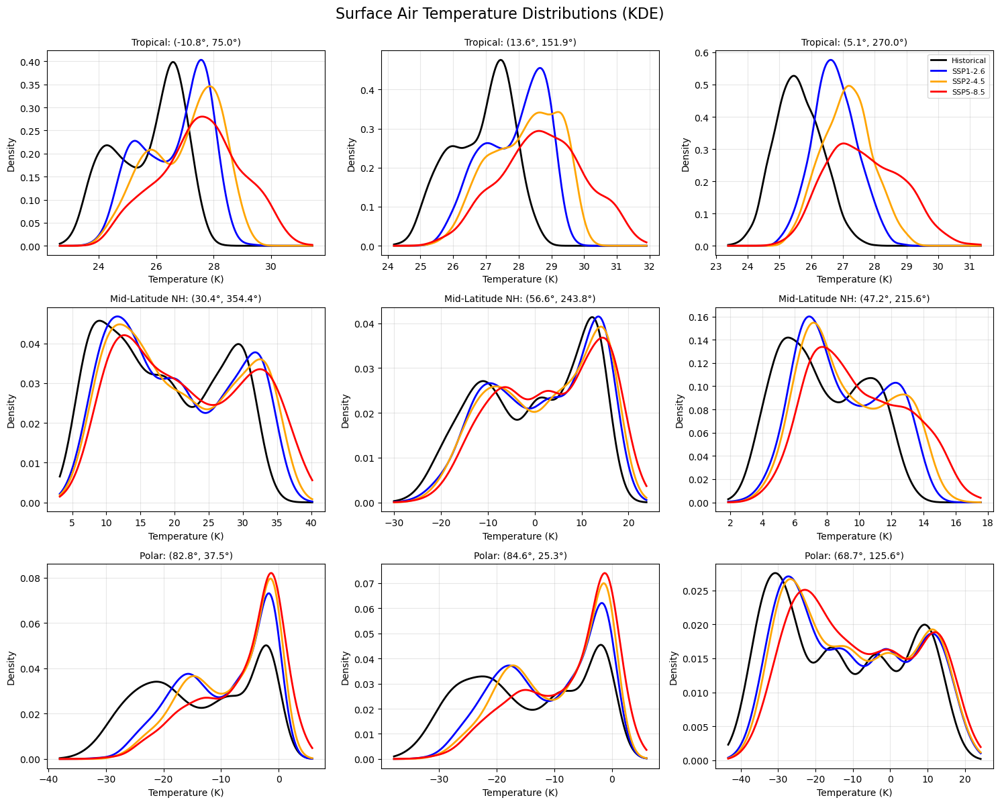

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Set random seed for reproducibility
np.random.seed(42)

# Define regions based on latitude
tropical_lats = ds_hist.lat[(ds_hist.lat >= -23.5) & (ds_hist.lat <= 23.5)]
midlat_lats = ds_hist.lat[(ds_hist.lat >= 30) & (ds_hist.lat <= 60)]
polar_lats = ds_hist.lat[ds_hist.lat >= 66.5]

# Randomly select 3 locations from each region
tropical_idx = np.random.choice(len(tropical_lats), 3, replace=False)
midlat_idx = np.random.choice(len(midlat_lats), 3, replace=False)
polar_idx = np.random.choice(len(polar_lats), 3, replace=False)

tropical_loc = [(tropical_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in tropical_idx]
midlat_loc = [(midlat_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in midlat_idx]
polar_loc = [(polar_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in polar_idx]

# Combine all locations
all_locations = [
    ("Tropical", tropical_loc),
    ("Mid-Latitude NH", midlat_loc),
    ("Polar", polar_loc)
]

# Create figure for distributions
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('Surface Air Temperature Distributions (KDE)', fontsize=16, y=0.995)

# Plot for each region and location
for row, (region_name, locations) in enumerate(all_locations):
    for col, (lat, lon) in enumerate(locations):
        ax = axes[row, col]
        
        # Extract data for this location
        tas_hist = ds_hist['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest').values
        tas_126 = ds_ssp126['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest').values
        tas_245 = ds_ssp245['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest').values
        tas_585 = ds_ssp585['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest').values
        
        # Remove NaN values
        tas_hist = tas_hist[~np.isnan(tas_hist)]
        tas_126 = tas_126[~np.isnan(tas_126)]
        tas_245 = tas_245[~np.isnan(tas_245)]
        tas_585 = tas_585[~np.isnan(tas_585)]
        
        # Compute KDE for each scenario
        kde_hist = stats.gaussian_kde(tas_hist)
        kde_126 = stats.gaussian_kde(tas_126)
        kde_245 = stats.gaussian_kde(tas_245)
        kde_585 = stats.gaussian_kde(tas_585)
        
        # Create temperature range for plotting
        temp_min = min(tas_hist.min(), tas_126.min(), tas_245.min(), tas_585.min())
        temp_max = max(tas_hist.max(), tas_126.max(), tas_245.max(), tas_585.max())
        temp_range = np.linspace(temp_min, temp_max, 200)
        
        # Plot KDEs
        ax.plot(temp_range, kde_hist(temp_range), 'k-', linewidth=2, label='Historical')
        ax.plot(temp_range, kde_126(temp_range), 'b-', linewidth=2, label='SSP1-2.6')
        ax.plot(temp_range, kde_245(temp_range), 'orange', linewidth=2, label='SSP2-4.5')
        ax.plot(temp_range, kde_585(temp_range), 'r-', linewidth=2, label='SSP5-8.5')
        
        # Formatting
        ax.set_title(f'{region_name}: ({lat:.1f}°, {lon:.1f}°)', fontsize=10)
        ax.set_xlabel('Temperature (K)')
        ax.set_ylabel('Density')
        ax.grid(True, alpha=0.3)
        
        if row == 0 and col == 2:
            ax.legend(loc='upper right', fontsize=8)

plt.tight_layout()
plt.show()

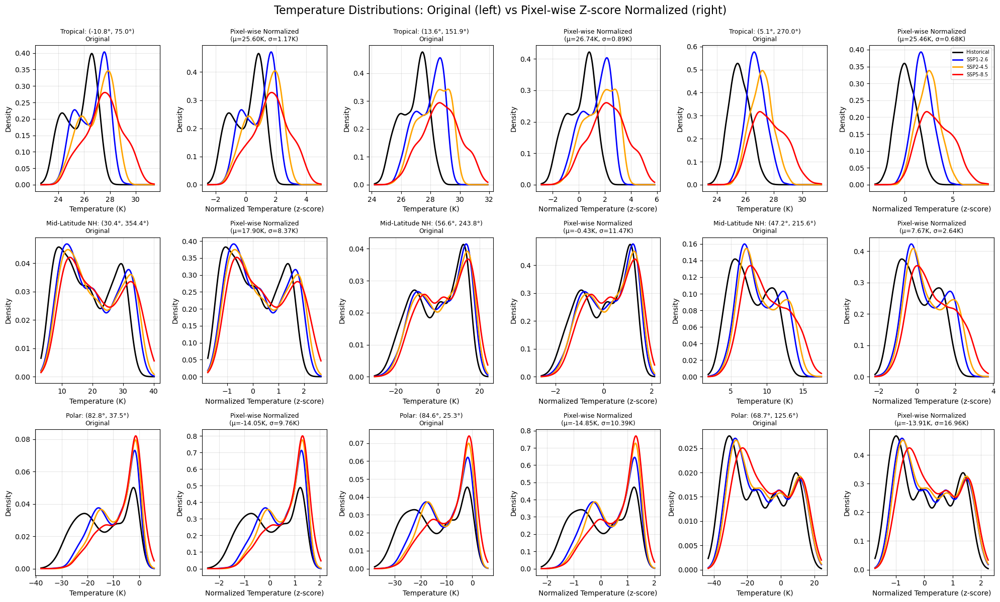

In [7]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import pickle

# Load normalization statistics
with open('data/norm_stats.pkl', 'rb') as f:
    norm_stats = pickle.load(f)

# Set random seed for reproducibility
np.random.seed(42)

# Define regions based on latitude
tropical_lats = ds_hist.lat[(ds_hist.lat >= -23.5) & (ds_hist.lat <= 23.5)]
midlat_lats = ds_hist.lat[(ds_hist.lat >= 30) & (ds_hist.lat <= 60)]
polar_lats = ds_hist.lat[ds_hist.lat >= 66.5]

# Randomly select 3 locations from each region
tropical_idx = np.random.choice(len(tropical_lats), 3, replace=False)
midlat_idx = np.random.choice(len(midlat_lats), 3, replace=False)
polar_idx = np.random.choice(len(polar_lats), 3, replace=False)

tropical_loc = [(tropical_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in tropical_idx]
midlat_loc = [(midlat_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in midlat_idx]
polar_loc = [(polar_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in polar_idx]

# Combine all locations
all_locations = [
    ("Tropical", tropical_loc),
    ("Mid-Latitude NH", midlat_loc),
    ("Polar", polar_loc)
]

# Get pixel-wise statistics for tas
pixel_mean = norm_stats['tas']['lr_interp']['pixel_mean']
pixel_std = norm_stats['tas']['lr_interp']['pixel_std']

# Create figure with before/after comparison
fig, axes = plt.subplots(3, 6, figsize=(20, 12))
fig.suptitle('Temperature Distributions: Original (left) vs Pixel-wise Z-score Normalized (right)', fontsize=16, y=0.995)

# Plot for each region and location
for row, (region_name, locations) in enumerate(all_locations):
    for col, (lat, lon) in enumerate(locations):
        ax_orig = axes[row, col*2]
        ax_norm = axes[row, col*2 + 1]
        
        # Extract data for this location
        tas_hist = ds_hist['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_126 = ds_ssp126['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_245 = ds_ssp245['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_585 = ds_ssp585['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        
        # Get pixel-wise mean and std for this location
        pm = pixel_mean.sel(lat=lat, lon=lon, method='nearest').values
        ps = pixel_std.sel(lat=lat, lon=lon, method='nearest').values
        
        # Apply pixel-wise z-score normalization
        tas_hist_norm = (tas_hist - pm) / ps
        tas_126_norm = (tas_126 - pm) / ps
        tas_245_norm = (tas_245 - pm) / ps
        tas_585_norm = (tas_585 - pm) / ps
        
        # Convert to numpy and remove NaNs
        tas_hist_vals = tas_hist.values[~np.isnan(tas_hist.values)]
        tas_126_vals = tas_126.values[~np.isnan(tas_126.values)]
        tas_245_vals = tas_245.values[~np.isnan(tas_245.values)]
        tas_585_vals = tas_585.values[~np.isnan(tas_585.values)]
        
        tas_hist_norm_vals = tas_hist_norm.values[~np.isnan(tas_hist_norm.values)]
        tas_126_norm_vals = tas_126_norm.values[~np.isnan(tas_126_norm.values)]
        tas_245_norm_vals = tas_245_norm.values[~np.isnan(tas_245_norm.values)]
        tas_585_norm_vals = tas_585_norm.values[~np.isnan(tas_585_norm.values)]
        
        # Plot ORIGINAL distributions
        kde_hist = stats.gaussian_kde(tas_hist_vals)
        kde_126 = stats.gaussian_kde(tas_126_vals)
        kde_245 = stats.gaussian_kde(tas_245_vals)
        kde_585 = stats.gaussian_kde(tas_585_vals)
        
        temp_min = min(tas_hist_vals.min(), tas_126_vals.min(), tas_245_vals.min(), tas_585_vals.min())
        temp_max = max(tas_hist_vals.max(), tas_126_vals.max(), tas_245_vals.max(), tas_585_vals.max())
        temp_range = np.linspace(temp_min, temp_max, 200)
        
        ax_orig.plot(temp_range, kde_hist(temp_range), 'k-', linewidth=2, label='Historical')
        ax_orig.plot(temp_range, kde_126(temp_range), 'b-', linewidth=2, label='SSP1-2.6')
        ax_orig.plot(temp_range, kde_245(temp_range), 'orange', linewidth=2, label='SSP2-4.5')
        ax_orig.plot(temp_range, kde_585(temp_range), 'r-', linewidth=2, label='SSP5-8.5')
        
        ax_orig.set_title(f'{region_name}: ({lat:.1f}°, {lon:.1f}°)\nOriginal', fontsize=9)
        ax_orig.set_xlabel('Temperature (K)')
        ax_orig.set_ylabel('Density')
        ax_orig.grid(True, alpha=0.3)
        
        # Plot NORMALIZED distributions
        kde_hist_norm = stats.gaussian_kde(tas_hist_norm_vals)
        kde_126_norm = stats.gaussian_kde(tas_126_norm_vals)
        kde_245_norm = stats.gaussian_kde(tas_245_norm_vals)
        kde_585_norm = stats.gaussian_kde(tas_585_norm_vals)
        
        temp_min_norm = min(tas_hist_norm_vals.min(), tas_126_norm_vals.min(), 
                            tas_245_norm_vals.min(), tas_585_norm_vals.min())
        temp_max_norm = max(tas_hist_norm_vals.max(), tas_126_norm_vals.max(), 
                            tas_245_norm_vals.max(), tas_585_norm_vals.max())
        temp_range_norm = np.linspace(temp_min_norm, temp_max_norm, 200)
        
        ax_norm.plot(temp_range_norm, kde_hist_norm(temp_range_norm), 'k-', linewidth=2, label='Historical')
        ax_norm.plot(temp_range_norm, kde_126_norm(temp_range_norm), 'b-', linewidth=2, label='SSP1-2.6')
        ax_norm.plot(temp_range_norm, kde_245_norm(temp_range_norm), 'orange', linewidth=2, label='SSP2-4.5')
        ax_norm.plot(temp_range_norm, kde_585_norm(temp_range_norm), 'r-', linewidth=2, label='SSP5-8.5')
        
        ax_norm.set_title(f'Pixel-wise Normalized\n(μ={pm:.2f}K, σ={ps:.2f}K)', fontsize=9)
        ax_norm.set_xlabel('Normalized Temperature (z-score)')
        ax_norm.set_ylabel('Density')
        ax_norm.grid(True, alpha=0.3)
        
        if row == 0 and col == 2:
            ax_norm.legend(loc='upper right', fontsize=7)

plt.tight_layout()
plt.show()


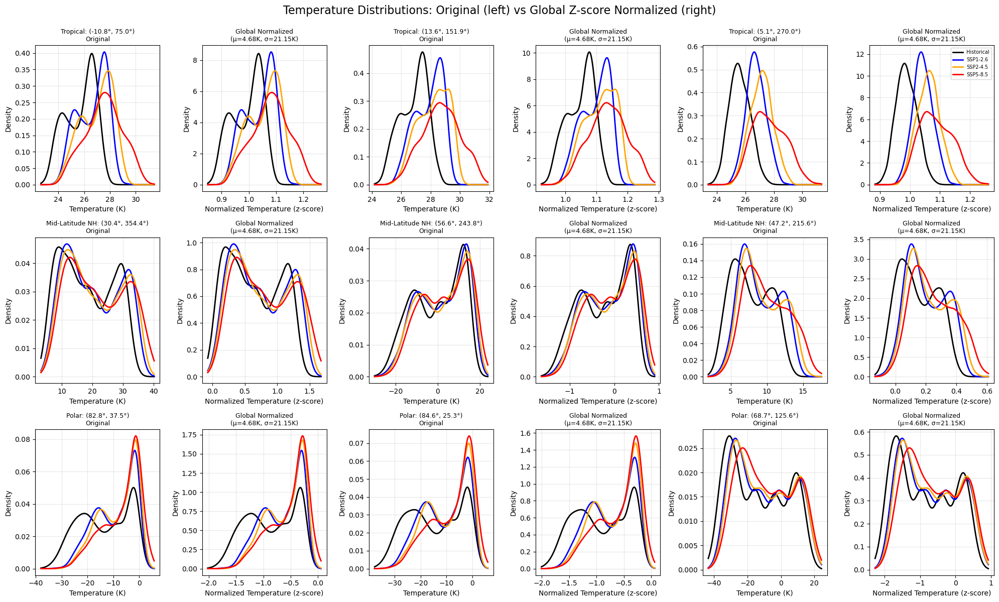

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import pickle

# Load normalization statistics
with open('data/norm_stats.pkl', 'rb') as f:
    norm_stats = pickle.load(f)

# Set random seed for reproducibility
np.random.seed(42)

# Define regions based on latitude
tropical_lats = ds_hist.lat[(ds_hist.lat >= -23.5) & (ds_hist.lat <= 23.5)]
midlat_lats = ds_hist.lat[(ds_hist.lat >= 30) & (ds_hist.lat <= 60)]
polar_lats = ds_hist.lat[ds_hist.lat >= 66.5]

# Randomly select 3 locations from each region
tropical_idx = np.random.choice(len(tropical_lats), 3, replace=False)
midlat_idx = np.random.choice(len(midlat_lats), 3, replace=False)
polar_idx = np.random.choice(len(polar_lats), 3, replace=False)

tropical_loc = [(tropical_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in tropical_idx]
midlat_loc = [(midlat_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in midlat_idx]
polar_loc = [(polar_lats.values[i], np.random.choice(ds_hist.lon.values)) for i in polar_idx]

# Combine all locations
all_locations = [
    ("Tropical", tropical_loc),
    ("Mid-Latitude NH", midlat_loc),
    ("Polar", polar_loc)
]

# Get global statistics for tas
global_mean = norm_stats['tas']['lr_interp']['global_mean']
global_std = norm_stats['tas']['lr_interp']['global_std']

# Create figure with before/after comparison
fig, axes = plt.subplots(3, 6, figsize=(20, 12))
fig.suptitle('Temperature Distributions: Original (left) vs Global Z-score Normalized (right)', fontsize=16, y=0.995)

# Plot for each region and location
for row, (region_name, locations) in enumerate(all_locations):
    for col, (lat, lon) in enumerate(locations):
        ax_orig = axes[row, col*2]
        ax_norm = axes[row, col*2 + 1]
        
        # Extract data for this location
        tas_hist = ds_hist['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_126 = ds_ssp126['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_245 = ds_ssp245['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        tas_585 = ds_ssp585['tas_lr_interp'].sel(lat=lat, lon=lon, method='nearest')
        
        # Apply global z-score normalization
        tas_hist_norm = (tas_hist - global_mean) / global_std
        tas_126_norm = (tas_126 - global_mean) / global_std
        tas_245_norm = (tas_245 - global_mean) / global_std
        tas_585_norm = (tas_585 - global_mean) / global_std
        
        # Convert to numpy and remove NaNs
        tas_hist_vals = tas_hist.values[~np.isnan(tas_hist.values)]
        tas_126_vals = tas_126.values[~np.isnan(tas_126.values)]
        tas_245_vals = tas_245.values[~np.isnan(tas_245.values)]
        tas_585_vals = tas_585.values[~np.isnan(tas_585.values)]
        
        tas_hist_norm_vals = tas_hist_norm.values[~np.isnan(tas_hist_norm.values)]
        tas_126_norm_vals = tas_126_norm.values[~np.isnan(tas_126_norm.values)]
        tas_245_norm_vals = tas_245_norm.values[~np.isnan(tas_245_norm.values)]
        tas_585_norm_vals = tas_585_norm.values[~np.isnan(tas_585_norm.values)]
        
        # Plot ORIGINAL distributions
        kde_hist = stats.gaussian_kde(tas_hist_vals)
        kde_126 = stats.gaussian_kde(tas_126_vals)
        kde_245 = stats.gaussian_kde(tas_245_vals)
        kde_585 = stats.gaussian_kde(tas_585_vals)
        
        temp_min = min(tas_hist_vals.min(), tas_126_vals.min(), tas_245_vals.min(), tas_585_vals.min())
        temp_max = max(tas_hist_vals.max(), tas_126_vals.max(), tas_245_vals.max(), tas_585_vals.max())
        temp_range = np.linspace(temp_min, temp_max, 200)
        
        ax_orig.plot(temp_range, kde_hist(temp_range), 'k-', linewidth=2, label='Historical')
        ax_orig.plot(temp_range, kde_126(temp_range), 'b-', linewidth=2, label='SSP1-2.6')
        ax_orig.plot(temp_range, kde_245(temp_range), 'orange', linewidth=2, label='SSP2-4.5')
        ax_orig.plot(temp_range, kde_585(temp_range), 'r-', linewidth=2, label='SSP5-8.5')
        
        ax_orig.set_title(f'{region_name}: ({lat:.1f}°, {lon:.1f}°)\nOriginal', fontsize=9)
        ax_orig.set_xlabel('Temperature (K)')
        ax_orig.set_ylabel('Density')
        ax_orig.grid(True, alpha=0.3)
        
        # Plot NORMALIZED distributions
        kde_hist_norm = stats.gaussian_kde(tas_hist_norm_vals)
        kde_126_norm = stats.gaussian_kde(tas_126_norm_vals)
        kde_245_norm = stats.gaussian_kde(tas_245_norm_vals)
        kde_585_norm = stats.gaussian_kde(tas_585_norm_vals)
        
        temp_min_norm = min(tas_hist_norm_vals.min(), tas_126_norm_vals.min(), 
                            tas_245_norm_vals.min(), tas_585_norm_vals.min())
        temp_max_norm = max(tas_hist_norm_vals.max(), tas_126_norm_vals.max(), 
                            tas_245_norm_vals.max(), tas_585_norm_vals.max())
        temp_range_norm = np.linspace(temp_min_norm, temp_max_norm, 200)
        
        ax_norm.plot(temp_range_norm, kde_hist_norm(temp_range_norm), 'k-', linewidth=2, label='Historical')
        ax_norm.plot(temp_range_norm, kde_126_norm(temp_range_norm), 'b-', linewidth=2, label='SSP1-2.6')
        ax_norm.plot(temp_range_norm, kde_245_norm(temp_range_norm), 'orange', linewidth=2, label='SSP2-4.5')
        ax_norm.plot(temp_range_norm, kde_585_norm(temp_range_norm), 'r-', linewidth=2, label='SSP5-8.5')
        
        ax_norm.set_title(f'Global Normalized\n(μ={global_mean:.2f}K, σ={global_std:.2f}K)', fontsize=9)
        ax_norm.set_xlabel('Normalized Temperature (z-score)')
        ax_norm.set_ylabel('Density')
        ax_norm.grid(True, alpha=0.3)
        
        if row == 0 and col == 2:
            ax_norm.legend(loc='upper right', fontsize=7)

plt.tight_layout()
plt.show()

/tmp/ipykernel_101023/4026286390.py:168: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.96])


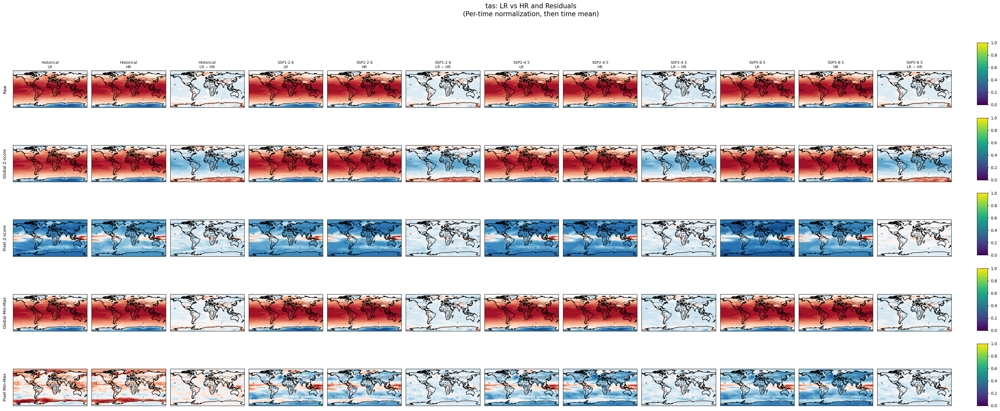

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pickle

# -------------------------------------------------
# Load normalization statistics
# -------------------------------------------------
with open('data/norm_stats.pkl', 'rb') as f:
    norm_stats = pickle.load(f)

# LR stats
lr_stats = norm_stats['tas']['lr_interp']
lr_pixel_mean = lr_stats['pixel_mean']
lr_pixel_std  = lr_stats['pixel_std']
lr_pixel_min  = lr_stats['pixel_min']
lr_pixel_max  = lr_stats['pixel_max']
lr_global_mean = lr_stats['global_mean']
lr_global_std  = lr_stats['global_std']
lr_global_min  = lr_stats['global_min']   # make sure these exist in your dict
lr_global_max  = lr_stats['global_max']

# HR stats
hr_stats = norm_stats['tas']['hr']
hr_pixel_mean = hr_stats['pixel_mean']
hr_pixel_std  = hr_stats['pixel_std']
hr_pixel_min  = hr_stats['pixel_min']
hr_pixel_max  = hr_stats['pixel_max']
hr_global_mean = hr_stats['global_mean']
hr_global_std  = hr_stats['global_std']
hr_global_min  = hr_stats['global_min']
hr_global_max  = hr_stats['global_max']

# -------------------------------------------------
# Scenario data (time, lat, lon) for LR and HR
# -------------------------------------------------
scenarios = {
    'Historical': (ds_hist['tas_lr_interp'],  ds_hist['tas_hr']),
    'SSP1-2.6':   (ds_ssp126['tas_lr_interp'], ds_ssp126['tas_hr']),
    'SSP2-4.5':   (ds_ssp245['tas_lr_interp'], ds_ssp245['tas_hr']),
    'SSP5-8.5':   (ds_ssp585['tas_lr_interp'], ds_ssp585['tas_hr']),
}

scenario_names = list(scenarios.keys())

# -------------------------------------------------
# Normalization helper
# -------------------------------------------------
def apply_norm(data, method, pixel_mean, pixel_std,
               pixel_min, pixel_max, global_mean,
               global_std, global_min, global_max):
    """
    data: xarray.DataArray (time, lat, lon)
    returns: xarray.DataArray (time, lat, lon) normalized per time index
    """
    if method == 'raw':
        return data
    elif method == 'global_z':
        return (data - global_mean) / global_std
    elif method == 'pixel_z':
        return (data - pixel_mean) / pixel_std
    elif method == 'global_minmax':
        return (data - global_min) / (global_max - global_min)
    elif method == 'pixel_minmax':
        return (data - pixel_min) / (pixel_max - pixel_min)
    else:
        raise ValueError(f"Unknown method: {method}")

norm_methods = [
    ('Raw',            'raw'),
    ('Global Z-score', 'global_z'),
    ('Pixel Z-score',  'pixel_z'),
    ('Global Min-Max', 'global_minmax'),
    ('Pixel Min-Max',  'pixel_minmax'),
]

# -------------------------------------------------
# Figure: 5 rows (methods) × 12 columns (3 fields × 4 scenarios)
# -------------------------------------------------
n_rows = len(norm_methods)
n_scen = len(scenario_names)
n_cols = n_scen * 3   # LR, HR, residual per scenario

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(3 * n_cols, 3 * n_rows),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

if n_rows == 1:
    axes = np.expand_dims(axes, 0)
if n_cols == 1:
    axes = np.expand_dims(axes, 1)

for i_row, (method_label, method_key) in enumerate(norm_methods):

    for j_scen, scen_name in enumerate(scenario_names):
        lr_da, hr_da = scenarios[scen_name]  # (time, lat, lon)

        # --- apply normalization per time index ---
        lr_norm = apply_norm(
            lr_da, method_key,
            lr_pixel_mean, lr_pixel_std,
            lr_pixel_min, lr_pixel_max,
            lr_global_mean, lr_global_std,
            lr_global_min, lr_global_max
        ).mean(dim='time')  # now average over time

        hr_norm = apply_norm(
            hr_da, method_key,
            hr_pixel_mean, hr_pixel_std,
            hr_pixel_min, hr_pixel_max,
            hr_global_mean, hr_global_std,
            hr_global_min, hr_global_max
        ).mean(dim='time')

        residual = lr_norm - hr_norm

        # column indices for this scenario (LR, HR, residual)
        col_lr  = j_scen * 3
        col_hr  = j_scen * 3 + 1
        col_res = j_scen * 3 + 2

        # ------------- plot LR -------------
        ax_lr = axes[i_row, col_lr]
        im_lr = ax_lr.contourf(
            lr_norm.lon, lr_norm.lat, lr_norm,
            levels=20, transform=ccrs.PlateCarree(), cmap='RdBu_r'
        )
        ax_lr.coastlines()
        ax_lr.add_feature(cfeature.BORDERS, linestyle=':')
        if i_row == 0:
            ax_lr.set_title(f'{scen_name}\nLR', fontsize=9)
        if col_lr == 0:
            ax_lr.text(-0.08, 0.5, method_label, transform=ax_lr.transAxes,
                       rotation=90, va='center', ha='right', fontsize=10)

        # ------------- plot HR -------------
        ax_hr = axes[i_row, col_hr]
        im_hr = ax_hr.contourf(
            hr_norm.lon, hr_norm.lat, hr_norm,
            levels=20, transform=ccrs.PlateCarree(), cmap='RdBu_r'
        )
        ax_hr.coastlines()
        ax_hr.add_feature(cfeature.BORDERS, linestyle=':')
        if i_row == 0:
            ax_hr.set_title(f'{scen_name}\nHR', fontsize=9)

        # ------------- plot Residual (LR - HR) -------------
        ax_res = axes[i_row, col_res]
        im_res = ax_res.contourf(
            residual.lon, residual.lat, residual,
            levels=20, transform=ccrs.PlateCarree(), cmap='RdBu_r'
        )
        ax_res.coastlines()
        ax_res.add_feature(cfeature.BORDERS, linestyle=':')
        if i_row == 0:
            ax_res.set_title(f'{scen_name}\nLR − HR', fontsize=9)

# optional: one colorbar per row using the last residual map
for i_row in range(n_rows):
    cax = fig.add_axes([0.92, 0.08 + (n_rows-1-i_row)*0.17, 0.01, 0.14])
    fig.colorbar(axes[i_row, -1].collections[0], cax=cax)

plt.suptitle('tas: LR vs HR and Residuals\n(Per-time normalization, then time mean)',
             fontsize=16, y=0.99)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])
plt.show()
